<h1 align="center"><strong>Welcome to our Data Analysis Project</strong></h1>


<div class="alert alert-info" role="alert">
   <p class="mb-0"><p><li> The data come with a lot of "NA" text strings that do <b>not</b> indicate missing data. </li></p>
   <p class="mb-0"><p><li> The mappings from column names to data types are encoded in the "utils.py".</li></p>
</div>


<img title="a title" alt="Alt text" src="https://learn.g2.com/hubfs/Imported%20sitepage%20images/1ZB5giUShe0gw9a6L69qAgsd7wKTQ60ZRoJC5Xq3BIXS517sL6i6mnkAN9khqnaIGzE6FASAusRr7w=w1439-h786.png">

<div class="alert alert-info" role="alert">
    <h2>There are four different generic data types defined that are listed as</h2>
    
   <p class="mb-0"><p><li> &nbsp; discrete &#8594; np.int64 </li></p>
    
   <p class="mb-0"><p><li>&nbsp;  continuous &#8594; np.float64</li></p>
    
   <p class="mb-0"><p><li>&nbsp;  nominal &#8594; object</li></p>

   <p class="mb-0"><p><li>&nbsp;  ordinal &#8594; object</li></p>

</div>


<div class="alert alert-success" role="alert">
  <p class="mb-0"><p>Jupyter's libraries pip install.</p>
</div>

In [1]:
# # Math Libraries
# ! pip install scipy

# # Data Libraries
# ! pip install numpy 
# ! pip install pandas
# ! pip install scikit-learn

# # locate the coordinates of addresses
# ! pip install geopy

# # Visualization Libraries
# ! pip install missingno
# ! pip install seaborn
# ! pip install plotly-express
# ! pip install statsmodels 

# # Clusters Libraries
# ! pip install pyprotoclust
# ! pip install matplotlib

<div class="alert alert-success" role="alert">
  <p class="mb-0"><p>Our libraries.</p>
</div>

In [2]:
# Math Libraries
from scipy.stats import boxcox 

# Data Libraries
import numpy as np
import pandas as pd
from scipy import stats
from sklearn.decomposition import PCA

# locate the coordinates of addresses
from geopy.geocoders import Nominatim

# Visualization Libraries
import missingno as msno
import seaborn as sns
import plotly.express as px
import statsmodels.api as sm

# Clusters Libraries
import scipy.cluster.hierarchy as sch # Hierarchy
from sklearn.cluster import KMeans # KMeans
from sklearn.cluster import AgglomerativeClustering # Agglomerative

# Math Plot Libraries
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Perdition models Libraries
from sklearn.ensemble import RandomForestRegressor # RandomForest
from sklearn import linear_model

# Evaluation Libraries
from sklearn.metrics import silhouette_score
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

# Warnings Libraries
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
# Showing all the columns of the data frame object
pd.set_option('display.max_columns', None)

<div class="alert alert-success" role="alert">
  <p class="mb-0"><p> Pulling some useful imformation for the data description text file.</p>
</div>



In [4]:
from utils import (
    ALL_COLUMNS,
    ALL_VARIABLES,
    CONTINUOUS_COLUMNS,
    CONTINUOUS_VARIABLES,
    DISCRETE_COLUMNS,
    DISCRETE_VARIABLES,
    INDEX_COLUMNS,
    LABEL_COLUMNS,  # A groups nominal and ordinal
    LABEL_TYPES,
    NOMINAL_COLUMNS,
    NOMINAL_VARIABLES,
    NUMERIC_VARIABLES,  # A groups continuous and discrete
    ORDINAL_COLUMNS,
    ORDINAL_VARIABLES,
    TARGET_VARIABLES,  # Sale Price
    correct_column_names, # A function to rename the columns with thier correct names
    print_column_list, # A function to print the cloumns with thier data description
    update_column_descriptions, # A function to update column data descriptions
)

<div class="alert alert-success" role="alert">
  <p class="mb-0"><p> keyword arguments.</p>
</div>


In [5]:
# Ensure each column is parsed as the correct data type.
kwargs = {
    
    # This creates a mapping from column name to data type.
    "dtype": {  
        column: (object if mapping_info["type"] in LABEL_TYPES else np.float64)        
        for (column, mapping_info) in ALL_COLUMNS.items()
    },
    
    # By default, pandas treats NA strings as missing, which is not the correct meaning here.
    "na_values": "", 
    "keep_default_na": False,  
}

<div class="alert alert-success" role="alert">
  <p class="mb-0"><p>Plotting functions.</p>
</div>

In [6]:
def plot_nulls(df : pd.DataFrame ,title :str ):
    msno.matrix(df);
    gray_patch = mpatches.Patch(color='gray', label='Data present')
    white_patch = mpatches.Patch(color='white', label='Data absent')
    plt.legend(handles=[gray_patch, white_patch])
    plt.title(title)
    plt.show()

In [7]:
# reading the excel file (.xls)
df = pd.read_excel("data/data_raw.xls", **kwargs)

<div class="alert alert-success" role="alert">
   <p class="mb-0"><p>Note that some columns names differ between the Excel file and the data description file.<br>
    Thus, Correct them with the values in the Excel file (.xls)</p>
</div>


In [8]:
correct_column_names(df.columns)

In [9]:
x, y = df.shape

<div class="alert alert-success" role="alert">
  <p class="mb-0"><p>Identifying columns in the data frame & removing the anonymous columns.</p>
</div>

In [10]:
# The target variable "SalePrice" is not in the description file.
df = df[ALL_VARIABLES + TARGET_VARIABLES]

In [11]:
print("There are",y - df.shape[1],"columns that are not mentioned in the data documentation" )

There are 3 columns that are not mentioned in the data documentation


<div class="alert alert-success" role="alert">
  <p class="mb-0"><p> Continuous Columns.</p>
</div>

In [12]:
print_column_list(CONTINUOUS_COLUMNS)

1st Flr SF       First Floor square feet
2nd Flr SF       Second floor square feet
3Ssn Porch       Three season porch area in square feet
Bsmt Unf SF      Unfinished square feet of basement area
BsmtFin SF 1     Type 1 finished square feet
BsmtFin SF 2     Type 2 finished square feet
Enclosed Porch   Enclosed porch area in square feet
Garage Area      Size of garage in square feet
Gr Liv Area      Above grade (ground) living area square feet
Lot Area         Lot size in square feet
Lot Frontage     Linear feet of street connected to property
Low Qual Fin SF  Low quality finished square feet (all floors)
Mas Vnr Area     Masonry veneer area in square feet
Misc Val         $Value of miscellaneous feature
Open Porch SF    Open porch area in square feet
Pool Area        Pool area in square feet
Screen Porch     Screen porch area in square feet
Total Bsmt SF    Total square feet of basement area
Wood Deck SF     Wood deck area in square feet


<div class="alert alert-success" role="alert">
  <p class="mb-0"><p> Discrete Columns.</p>
</div>

In [13]:
print_column_list(DISCRETE_COLUMNS)

Bedroom AbvGr   Bedrooms above grade (does NOT include basement bedrooms)
Bsmt Full Bath  Basement full bathrooms
Bsmt Half Bath  Basement half bathrooms
Fireplaces      Number of fireplaces
Full Bath       Full bathrooms above grade
Garage Cars     Size of garage in car capacity
Garage Yr Blt   Year garage was built
Half Bath       Half baths above grade
Kitchen AbvGr   Kitchens above grade
Mo Sold         Month Sold (MM)
TotRms AbvGrd   Total rooms above grade (does not include bathrooms)
Year Built      Original construction date
Year Remod/Add  Remodel date (same as construction date if no remodeling or additions)
Yr Sold         Year Sold (YYYY)


<div class="alert alert-success" role="alert">
  <p class="mb-0"><p> Nominal Columns.</p>
</div>

In [14]:
print_column_list(NOMINAL_COLUMNS)

Alley           Type of alley access to property
Bldg Type       Type of dwelling
Central Air     Central air conditioning
Condition 1     Proximity to various conditions
Condition 2     Proximity to various conditions (if more than one is present)
Exterior 1st    Exterior covering on house
Exterior 2nd    Exterior covering on house (if more than one material)
Foundation      Type of foundation
Garage Type     Garage location
Heating         Type of heating
House Style     Style of dwelling
Land Contour    Flatness of the property
Lot Config      Lot configuration
MS SubClass     Identifies the type of dwelling involved in the sale.
MS Zoning       Identifies the general zoning classification of the sale.
Mas Vnr Type    Masonry veneer type
Misc Feature    Miscellaneous feature not covered in other categories
Neighborhood    Physical locations within Ames city limits (map available)
Roof Matl       Roof material
Roof Style      Type of roof
Sale Condition  Condition of sale
Sale Type  

<div class="alert alert-success" role="alert">
  <p class="mb-0"><p> Ordinal Columns.</p>
</div>

In [15]:
print_column_list(ORDINAL_COLUMNS)

Bsmt Cond       Evaluates the general condition of the basement
Bsmt Exposure   Refers to walkout or garden level walls
Bsmt Qual       Evaluates the height of the basement
BsmtFin Type 1  Rating of basement finished area
BsmtFin Type 2  Rating of basement finished area (if multiple types)
Electrical      Electrical system
Exter Cond      Evaluates the present condition of the material on the exterior
Exter Qual      Evaluates the quality of the material on the exterior
Fence           Fence quality
Fireplace Qu    Fireplace quality
Functional      Home functionality (Assume typical unless deductions are warranted)
Garage Cond     Garage condition
Garage Finish   Interior finish of the garage
Garage Qual     Garage quality
Heating QC      Heating quality and condition
Kitchen Qual    Kitchen quality
Land Slope      Slope of property
Lot Shape       General shape of property
Overall Cond    Rates the overall condition of the house
Overall Qual    Rates the overall material and finish of

<div class="alert alert-success" role="alert">
      <h4
          class="alert-heading">Stage 1.0 in Data pre-processing !
      </h4>
  <hr>
      <p
         class="mb-0">Removing the Nulls, visually
      </p>
</div>

In [16]:
# List to carry all the bad columns 
bad_col = []

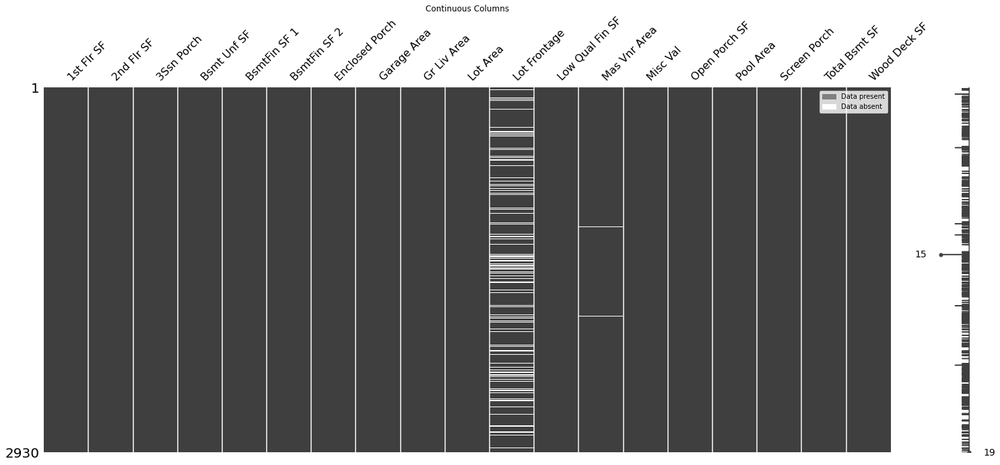

In [17]:
plot_nulls(df[CONTINUOUS_VARIABLES] ,"Continuous Columns" )

In [18]:
x = df["Lot Frontage"].isnull().sum()/df.shape[0] * (100)
print(f"{int(x)} % of the data in Lot Frontage column is null")

# Add this column to the null columns
bad_col.append("Lot Frontage")

16 % of the data in Lot Frontage column is null


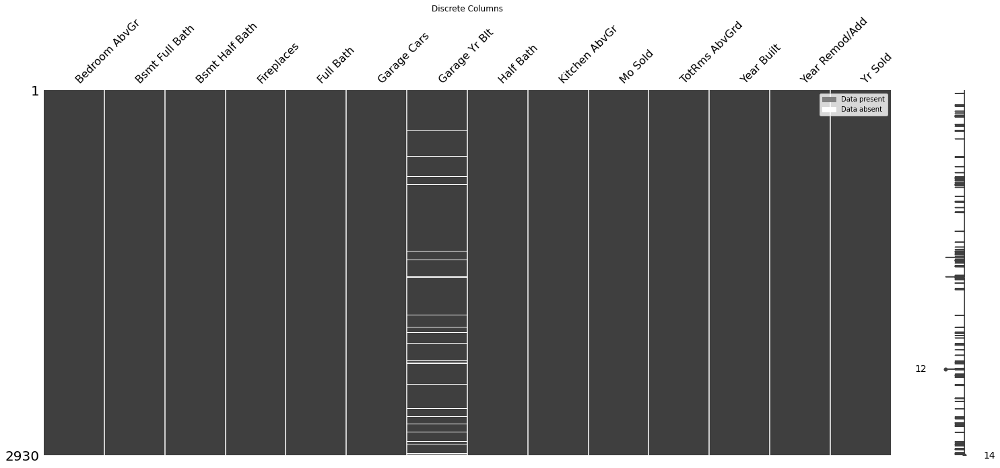

In [19]:
plot_nulls(df[DISCRETE_VARIABLES] ,"Discrete Columns" )

In [20]:
x = df["Garage Yr Blt"].isnull().sum()/df.shape[0] * (100)
print(f"{int(x)}% of the data in Lot Frontage column is null")

# Add this column to the null columns
bad_col.append("Garage Yr Blt")

5% of the data in Lot Frontage column is null


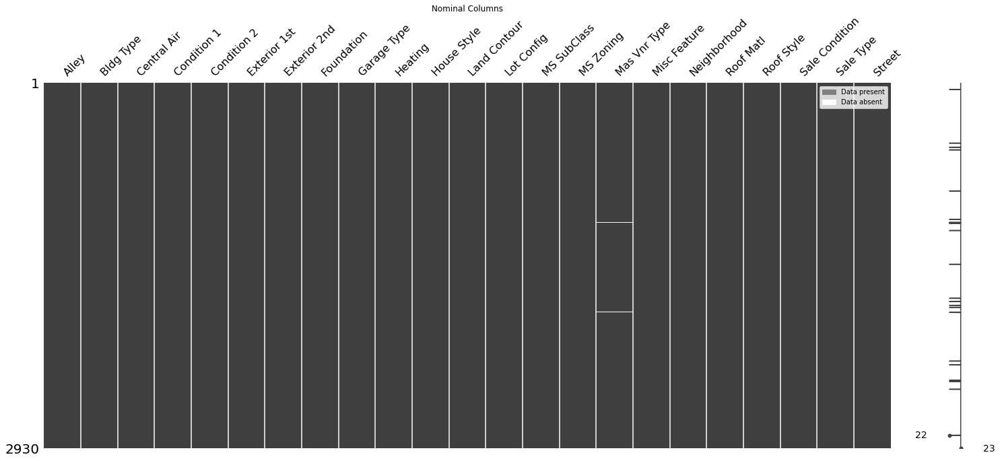

In [21]:
plot_nulls(df[NOMINAL_VARIABLES] ,"Nominal Columns")

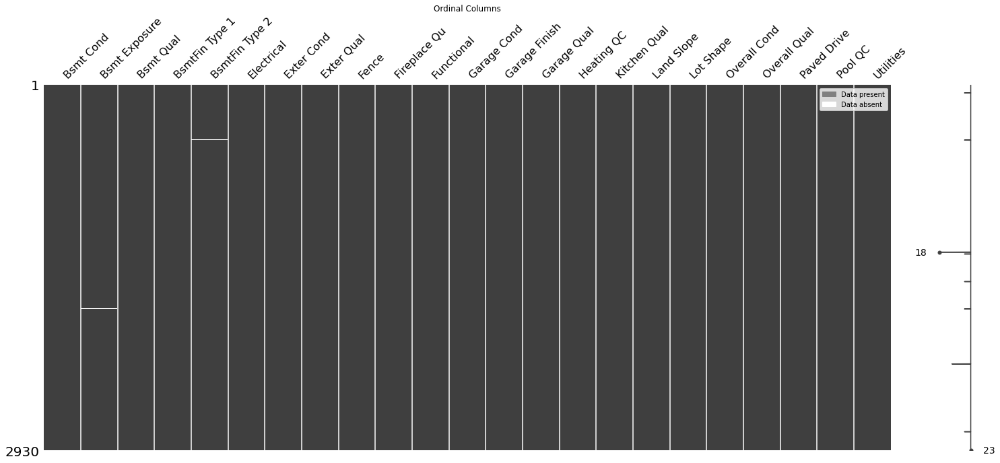

In [22]:
plot_nulls(df[ORDINAL_VARIABLES] ,"Ordinal Columns")

<div class="alert alert-success" role="alert">
      <h4
          class="alert-heading">Stage 1.1 in Data pre-processing !
      </h4>
  <hr>
      <p
         class="mb-0">Droping the Null Columns and Rows
      </p>
</div>

In [23]:
x , y = df.shape

In [24]:
# Columns
df.drop(bad_col, axis = 1, inplace = True) 

# Rows
df.dropna(axis = 0 , inplace = True)

In [25]:
print("We removed",x - df.shape[0],"null rows, and",y - df.shape[1],"null Columns\nWe are left out with",df.shape[0],"rows and", df.shape[1], "columns" )

We removed 32 null rows, and 2 null Columns
We are left out with 2898 rows and 78 columns


In [26]:
# Droped Columns details
print_column_list(bad_col)

Garage Yr Blt  Year garage was built
Lot Frontage   Linear feet of street connected to property


In [27]:
# Remove the discarded columns from the helper lists.
df = df[sorted(set(ALL_VARIABLES) - set(bad_col)) + TARGET_VARIABLES]
update_column_descriptions(df.columns)

<div class="alert alert-success" role="alert">
          <h4
          class="alert-heading">Stage 1.2 in Data pre-processing !
      </h4>
  <p class="mb-0"><p>Confirming the type of each different numerical generic</p>

</div>

In [28]:
for column in CONTINUOUS_VARIABLES + TARGET_VARIABLES:
    df[column] = df[column].astype(np.float64)
    
for column in DISCRETE_VARIABLES:
    df[column] = df[column].astype(np.int64)

<div class="alert alert-success" role="alert">
      <h4
          class="alert-heading">Stage 2.0 in Data pre-processing !
      </h4>
  <hr>
      <p
         class="mb-0"> Handling Skewed data

</div>


<div class="alert alert-success" role="alert">
          <h4
          class="alert-heading">Stage 2.1 in Data pre-processing !
      </h4>
  <p class="mb-0"><p>Plotting the histogram for continuous variables, with more the two unqie values</p>

</div>

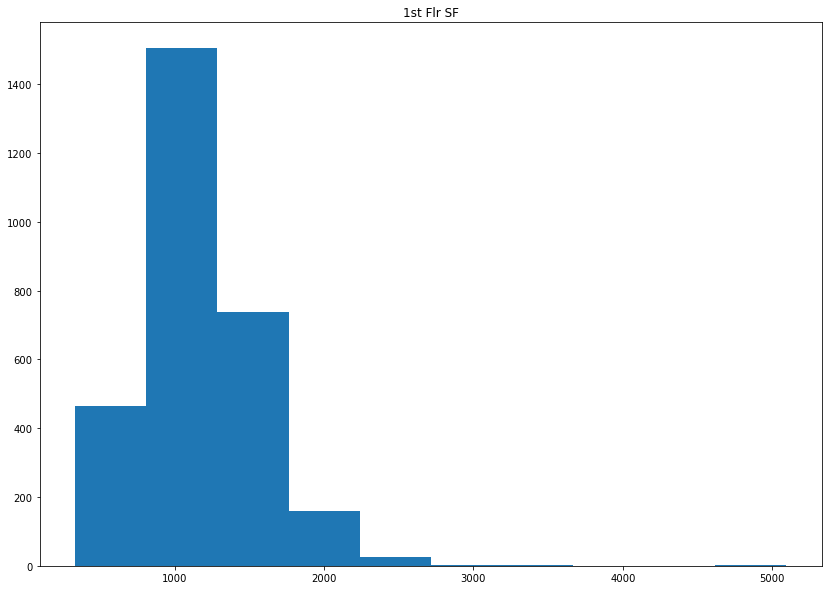

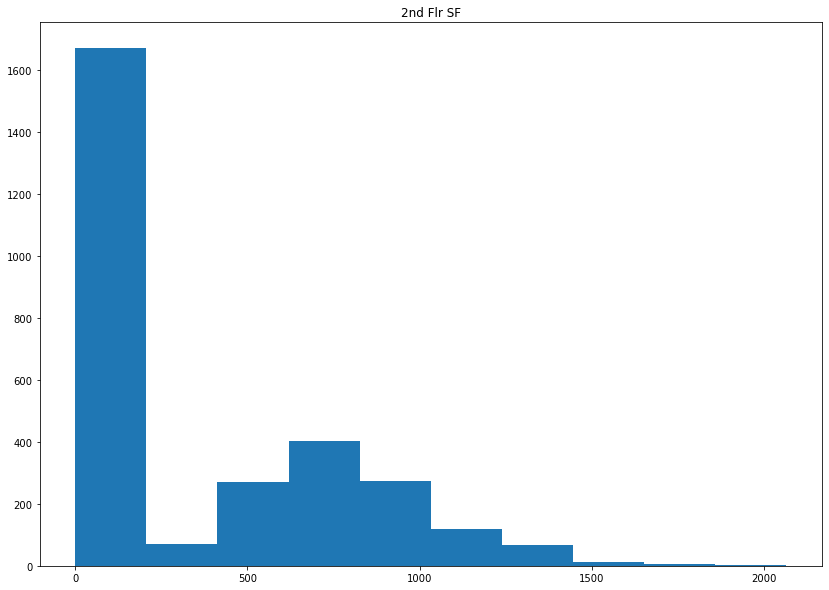

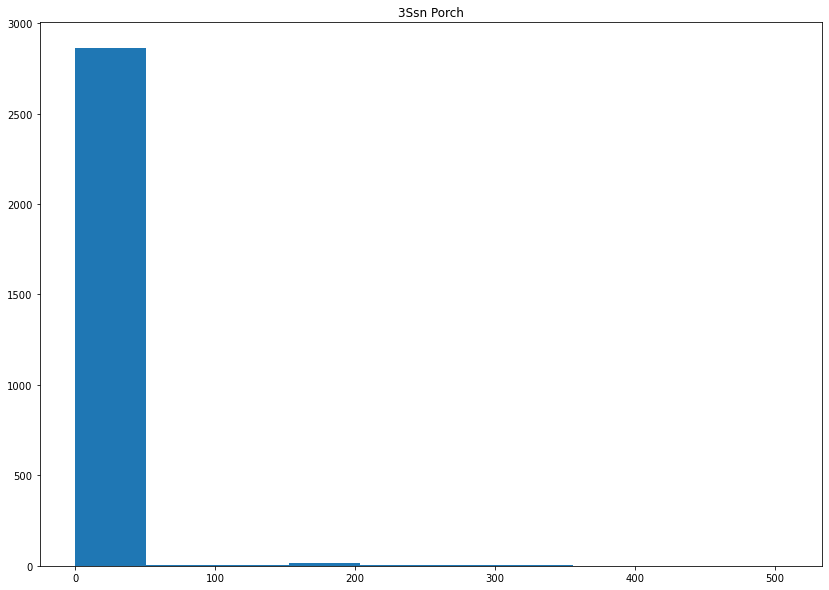

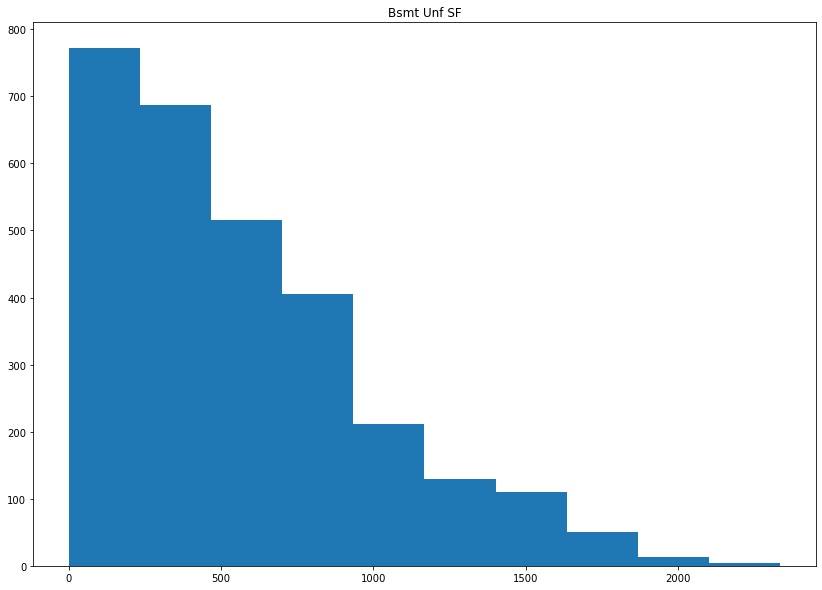

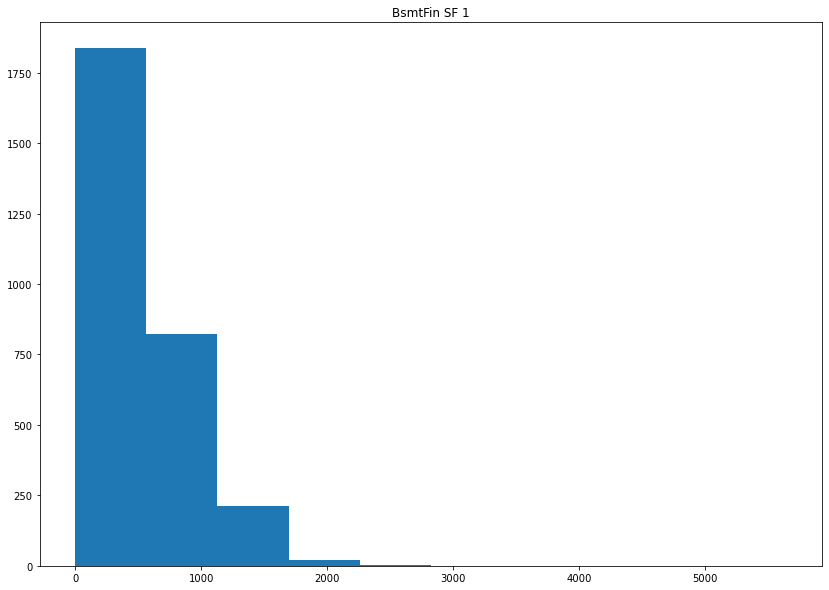

...

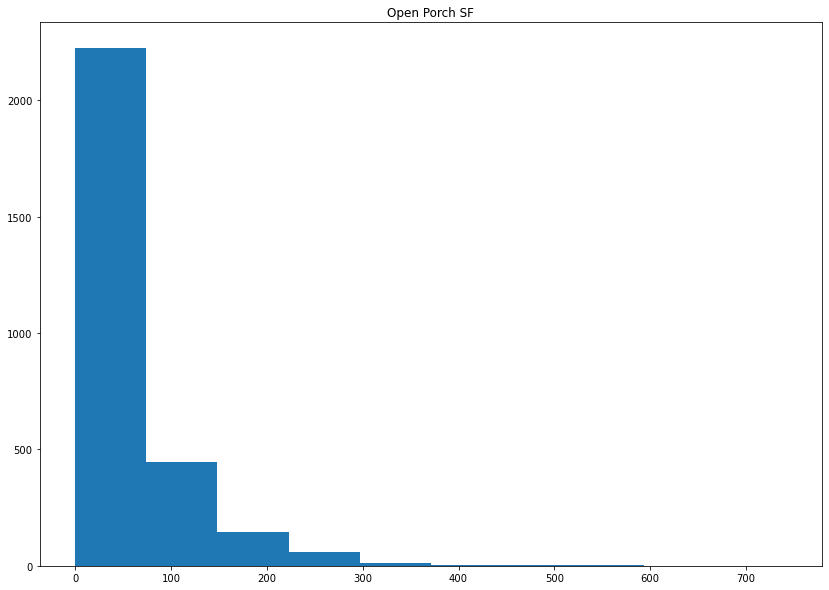

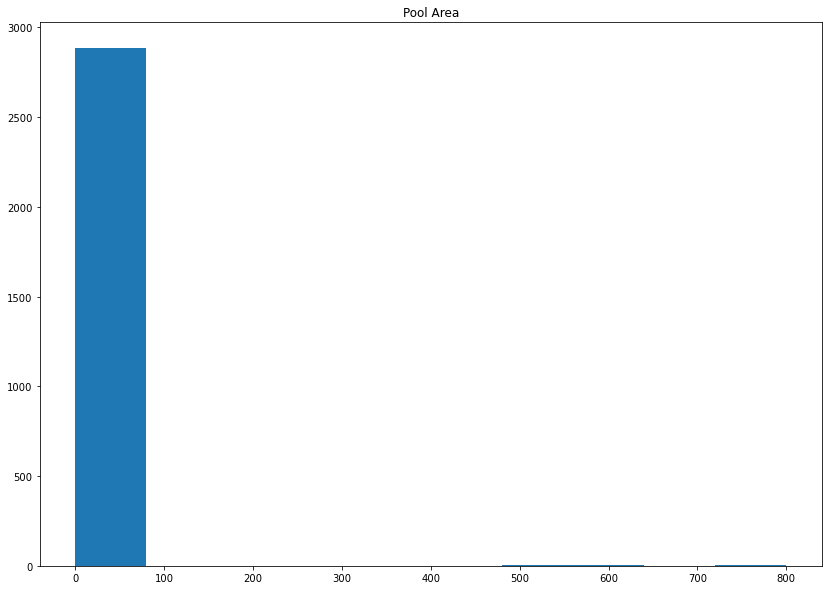

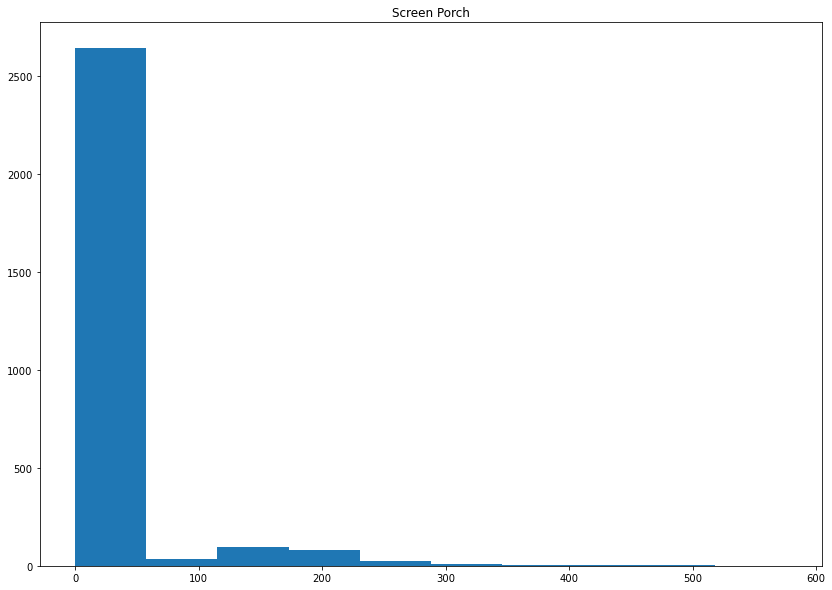

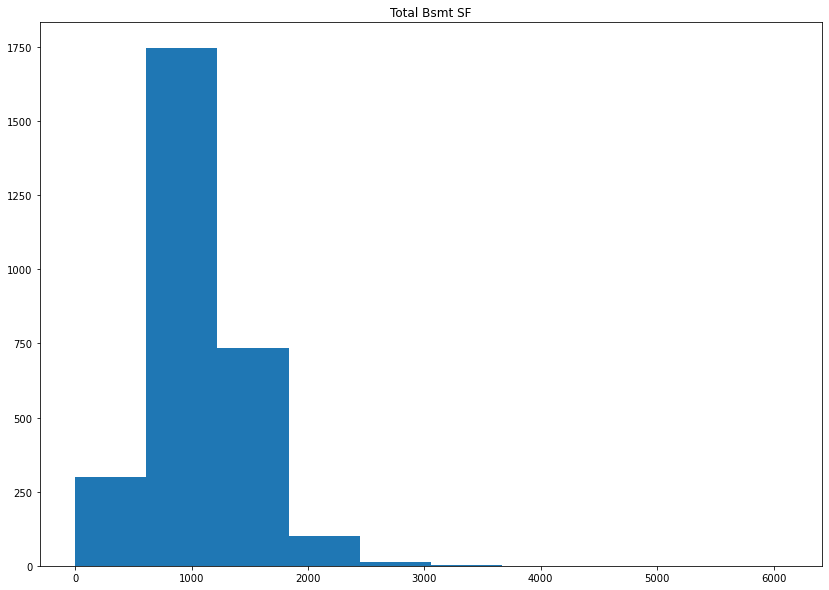

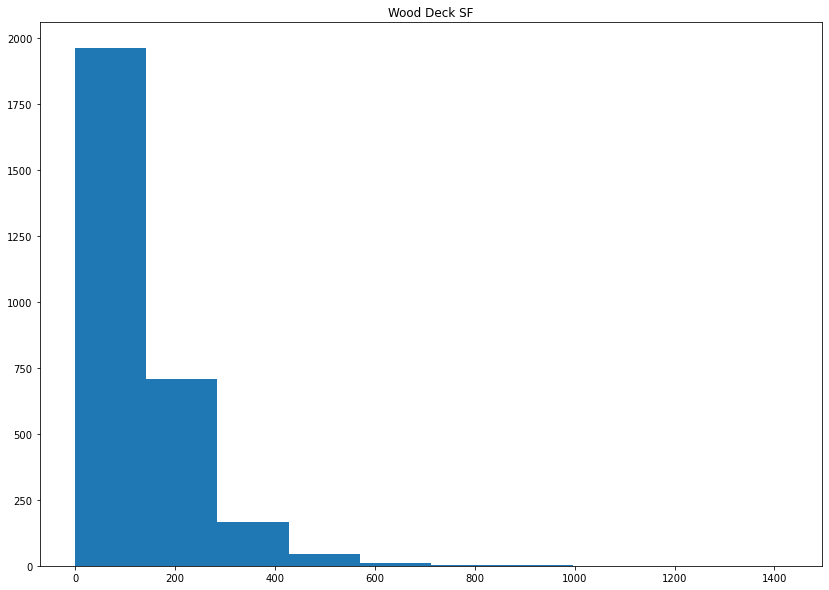

In [29]:
for i, x in enumerate(df[CONTINUOUS_VARIABLES]):
    if len(df[x].value_counts().values) <= 2:
        pass
    else:
        plt.figure(figsize = (300,10))
        plt.subplot (1,df[CONTINUOUS_VARIABLES].shape[1],i+1)
        plt.title(x)
        plt.hist(df[x], bins = 100);

<div class="alert alert-success" role="alert">
          <h4
          class="alert-heading">Stage 2.2 in Data pre-processing !
      </h4>
  <p class="mb-0"><p>Box Cox Transformation</p>

</div>

<div class="alert alert-warning" role="alert">
  <p class="mb-0">Bonus notes on 
      <a href="https://www.statisticshowto.com/probability-and-statistics/normal-distributions/box-cox-transformation/" class="alert-link">Box Cox Transformation.</a>
</div>

**For positive numbers**
$$
y(\lambda) =\begin{cases} \frac{y^{\lambda}-1}{\lambda} & \lambda \neq 0\\\log{y} & \lambda = 0\end{cases}
$$

**For Negative numbers**
$$
y(\lambda) =\begin{cases} \frac{(y+\lambda_{2})^{\lambda_{1}}-1}{\lambda_{1}} & \lambda_{1} \neq 0\\\log{(y +\lambda_{2}) } & \lambda_{1}= 0\end{cases}
$$

**Transformed Data example**


| $\lambda$ **lamda** | **Transformed Data** |
|---------------------|--------------------|
| -2                  |$y^{-2}$            |
| -1                  |$y^{-1}$            |
| -0.5                |$\frac{1}{\sqrt{y}}$|
| 0                   |$\log{y}$           |
| 0.5                 |$\sqrt{y}$          |
| 1                   |$y$                 |
| 2                   |$y^{2}$             |

Working on column: 1st Flr SF
Lambda value used for the transformation: -0.04112522974712194

Working on column: Lot Area
Lambda value used for the transformation: 0.1326303368429723

Working on column: Gr Liv Area
Lambda value used for the transformation: -0.016374889595824876



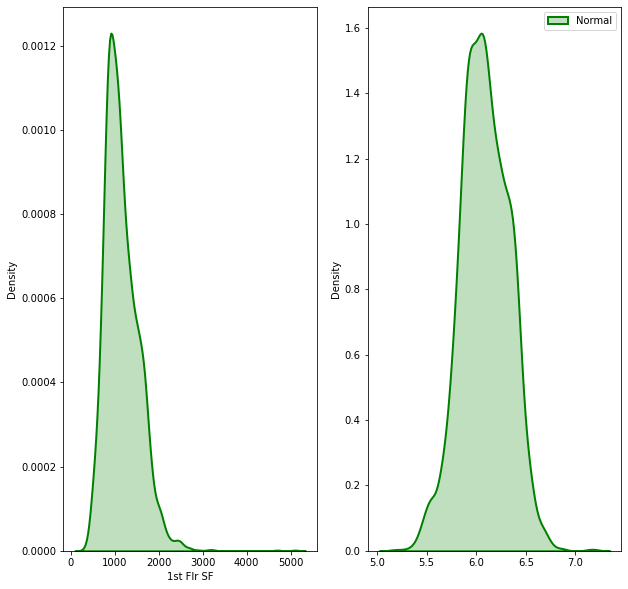

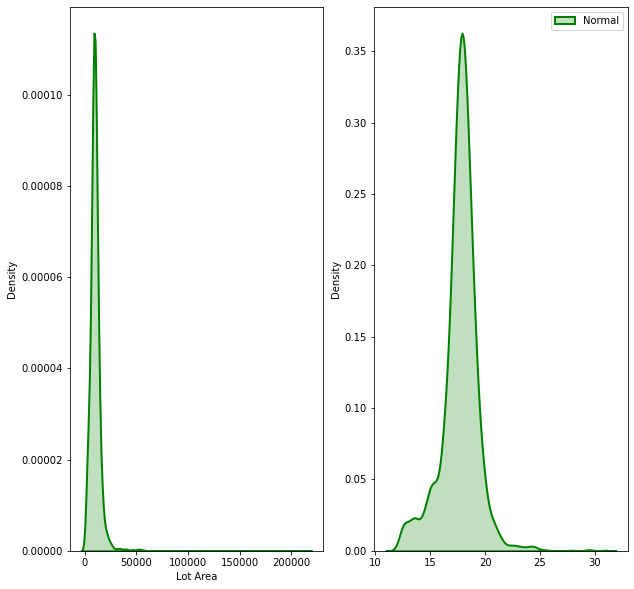

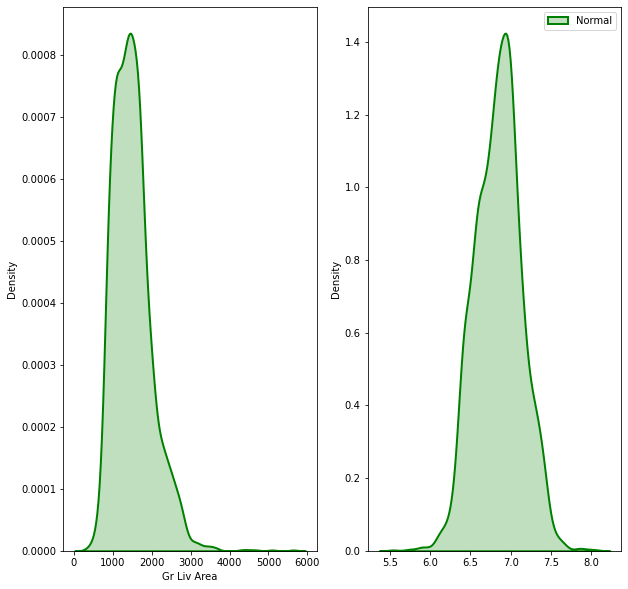

In [30]:
for column in ["1st Flr SF", "Lot Area" , "Gr Liv Area"]:
    
    print('Working on column: {}'.format(column))
    
    # boxcox function
    fitted_data, fitted_lambda = stats.boxcox(df[column])
    

    
    # creating axes to draw plots
    fig, ax = plt.subplots(1, 2)

    # plotting the original data (skewed)
    sns.distplot(df[column], hist = False, kde = True,
                kde_kws = {'shade': True, 'linewidth': 2},
                label = "Skewed", color ="green", ax = ax[0])

    # plotting the fitted data (normal)
    sns.distplot(fitted_data, hist = False, kde = True,
                kde_kws = {'shade': True, 'linewidth': 2},
                label = "Normal", color ="green", ax = ax[1])

    # adding legends to the subplots
    plt.legend(loc = "upper right")

    # rescaling the subplots
    fig.set_figheight(10)
    fig.set_figwidth(30)
    
    print(f"Lambda value used for the transformation: {fitted_lambda}\n")
    
    #Replacing the skewed data with a normal distributed one
    df[column] = fitted_data

<div class="alert alert-success" role="alert">
          <h4
          class="alert-heading">Stage 3.1 in Data pre-processing !
      </h4>
  <p class="mb-0"><p>Removing the outliers</p>

</div>

![https://upload.wikimedia.org/wikipedia/commons/2/25/The_Normal_Distribution.svg](https://upload.wikimedia.org/wikipedia/commons/2/25/The_Normal_Distribution.svg)

In [1]:
x , y = df.shape

NameError: name 'df' is not defined

In [32]:
std = 4

In [33]:
def remove_outliers(df,columns,n_std):
    for col in columns:
        print('Working on column: {}'.format(col))
        
        mean = df[col].mean()
        
        sd = df[col].std()
        
        df = df[(df[col] <= mean+(n_std*sd))]
    return df

In [34]:
df = remove_outliers(df,CONTINUOUS_VARIABLES,std)

Working on column: 1st Flr SF
Working on column: 2nd Flr SF
Working on column: 3Ssn Porch
Working on column: Bsmt Unf SF
Working on column: BsmtFin SF 1
Working on column: BsmtFin SF 2
Working on column: Enclosed Porch
Working on column: Garage Area
Working on column: Gr Liv Area
Working on column: Lot Area
Working on column: Low Qual Fin SF
Working on column: Mas Vnr Area
Working on column: Misc Val
Working on column: Open Porch SF
Working on column: Pool Area
Working on column: Screen Porch
Working on column: Total Bsmt SF
Working on column: Wood Deck SF


In [35]:
print("We removed",x - df.shape[0],"outlierd rows\nWe are left out with",df.shape[0],"rows")

We removed 266 outlierd rows
We are left out with 2632 rows


<div class="alert alert-success" role="alert">
          <h4
          class="alert-heading">Stage 4.0 Pearson's Correlation !
      </h4>

</div>

In [ ]:
Bsmt_Exposure = {
    "NA" : 0, # No Basement
    "No" : 1, # No Exposure
    "Mn" : 2, # Mimimum Exposure
    "Av" : 3, # Average Exposure
    "Gd" : 4, # Good Exposure
}

Bsmt_Qual = {
    "NA" : 0, # No Basement
    "Po" : 1, # <70 inches
    "Fa" : 2, # 70-79 inches
    "TA" : 3, # 80-89 inches
    "Gd" : 4, # 90-99 inches
    "Ex" : 5, # 100+ inches
}

BsmtFin_Type_1 = {
    "NA"  : 0, # No Basement
    "Unf" : 1, # Unfinshed
    "LwQ" : 2, # Low Quality
    "Rec" : 3, # Average Rec Room
    "BLQ" : 4, # Below Average Living Quarters
    "ALQ" : 5, # Average Living Quarters
    "GLQ" : 6, # Good Living Quarters
}

Exter_Qual = {
    "Po" : 1, # Poor
    "Fa" : 2, # Fair
    "TA" : 3, # Average/Typical
    "Gd" : 4, # Good
    "Ex" : 5, # Excellent
}

Fence = {
    "NA"    : 0, # No Fence
    "MnWw"  : 1, # Minimum Wood/Wire
    "GdWo"  : 2, # Good Wood
    "MnPrv" : 3, # Minimum Privacy
    "GdPrv" : 4, # Good Privacy
}

Fireplace_Qu = {
    "NA" : 0, # No Fireplace
    "Po" : 1, # Ben Franklin Stove
    "Fa" : 2, # Prefabricated Fireplace in basement
    "TA" : 3, # Prefabricated Fireplace in main living area or Masonry 
    "Gd" : 4, # Masonry Fireplace in main level
    "Ex" : 5, # Exceptional Masonry Fireplace
}

Garage_Finish = {
    "NA" : 0, # No Garage
    "Unf" : 0, # Unfinished
    "RFn" : 0, # Rough Finished
    "Fin" : 0, # Finished
}

Heating_QC = {
    "Po" : 1, # Poor
    "Fa" : 2, # Fair
    "TA" : 3, # Average/Typical
    "Gd" : 4, # Good
    "Ex" : 5, # Excellent
}

Kitchen_Qual = {
    "Po" : 1, # Poor
    "Fa" : 2, # Fair
    "TA" : 3, # Average/Typical
    "Gd" : 4, # Good
    "Ex" : 5, # Excellent
}

Lot_Shape = {
    "Reg" : 4, # Regular
    "IR1" : 3, # Slightly irregular
    "IR2" : 2, # Moderately Irregular
    "IR3" : 1, # Irregular
}

In [ ]:
df["Bsmt Exposure"]  = df["Bsmt Exposure"].replace(Bsmt_Exposure)
df["Bsmt Qual"]      = df["Bsmt Qual"].replace(Bsmt_Qual)
df["BsmtFin Type 1"] = df["BsmtFin Type 1"].replace(BsmtFin_Type_1)
df["Exter Qual"]     = df["Exter Qual"].replace(Exter_Qual)
df["Fence"]          = df["Fence"].replace(Fence)
df["Fireplace Qu"]   = df["Fireplace Qu"].replace(Fireplace_Qu)
df["Garage Finish"]  = df["Garage Finish"].replace(Garage_Finish)
df["Heating QC"]     = df["Heating QC"].replace(Heating_QC)
df["Kitchen Qual"]   = df["Kitchen Qual"].replace(Kitchen_Qual)
df["Lot Shape"]      = df["Lot Shape"].replace(Lot_Shape)

In [36]:
columns = CONTINUOUS_VARIABLES + TARGET_VARIABLES
pearson = df[columns].corr(method="pearson")

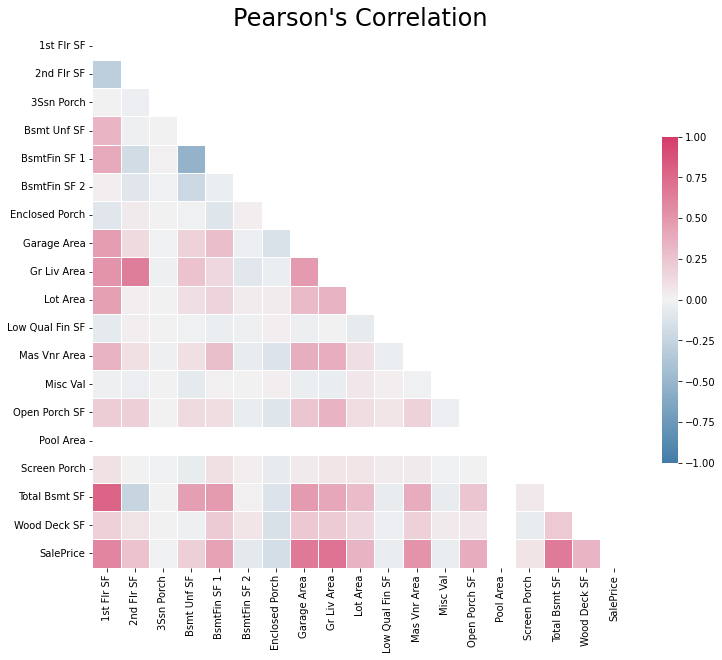

In [37]:
fig, ax = plt.subplots(figsize=(12, 12))
ax.set_title("Pearson's Correlation", fontsize=24)

# Blank out the upper triangular part of the matrix.
mask = np.zeros_like(df[columns].corr(method="pearson"), dtype=bool)
mask[np.triu_indices_from(mask)] = True

# Use a diverging color map.
cmap = sns.diverging_palette(240, 0, as_cmap=True)

# Adjust the labels' font size.
labels = df[columns].corr(method="pearson").columns

# Plot it.
sns.heatmap(
    df[columns].corr(method="pearson"), vmin=-1, vmax=1, cmap=cmap, center=0, linewidths=.5,
    cbar_kws={"shrink": .5}, square=True, mask=mask, ax=ax
);

In [38]:
strong = 0.66
weak = 0.33
uncorrelated = 0.1

In [39]:
pearson_weakly_correlated = set()
pearson_strongly_correlated = set()
pearson_uncorrelated = set()

In [40]:
# Iterate over the raw and transformed target.
for target in TARGET_VARIABLES:
    
    # Removing the negative ie; deaing with -1 & 1 as Strongly Correlated
    corrs = pearson.loc[target].drop(TARGET_VARIABLES).abs() 
    
    # Strongly correlated
    pearson_strongly_correlated |= set(corrs[(strong < corrs)].index)

    # Weakly correlated
    pearson_weakly_correlated |= set(corrs[(weak < corrs) & (corrs <= strong)].index)
    
    # Uncorrelated
    pearson_uncorrelated |= set(corrs[(corrs < uncorrelated)].index)


# Uncorrelated


In [41]:
print_column_list(pearson_uncorrelated)

3Ssn Porch       Three season porch area in square feet
BsmtFin SF 2     Type 2 finished square feet
Low Qual Fin SF  Low quality finished square feet (all floors)
Misc Val         $Value of miscellaneous feature
Screen Porch     Screen porch area in square feet


# weakly correlated

In [42]:
print_column_list(pearson_weakly_correlated)

1st Flr SF     First Floor square feet
BsmtFin SF 1   Type 1 finished square feet
Garage Area    Size of garage in square feet
Lot Area       Lot size in square feet
Mas Vnr Area   Masonry veneer area in square feet
Open Porch SF  Open porch area in square feet
Total Bsmt SF  Total square feet of basement area
Wood Deck SF   Wood deck area in square feet


# strongly correlated

In [43]:
print_column_list(pearson_strongly_correlated)

Gr Liv Area  Above grade (ground) living area square feet


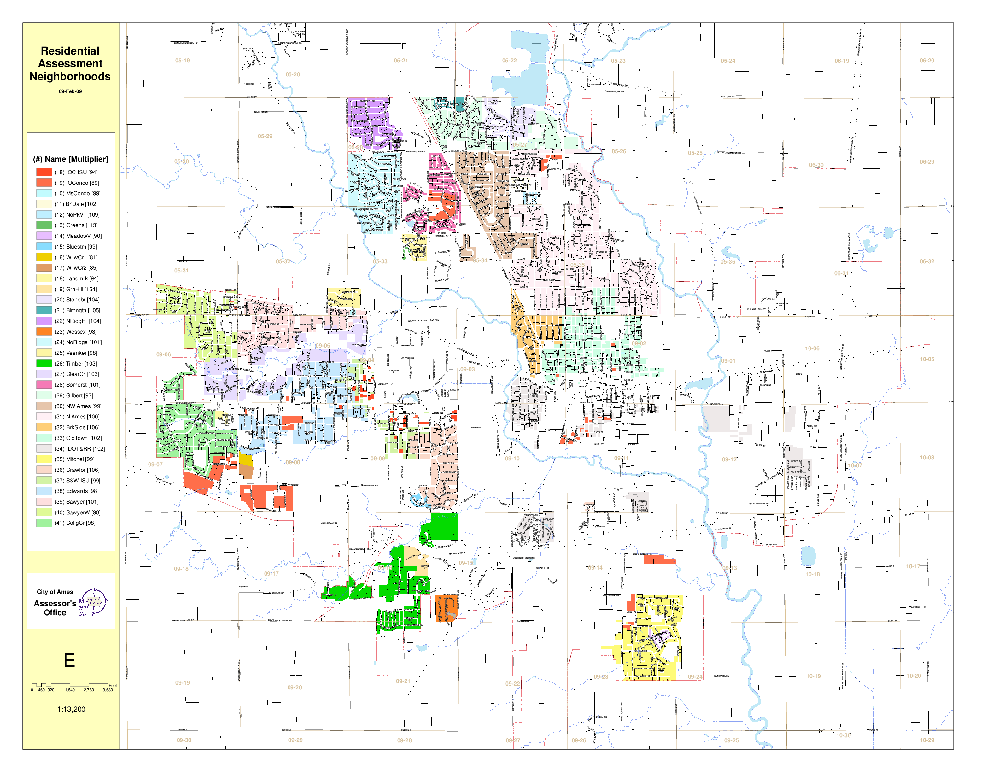

In [44]:
from wand.image import Image
MAP_PDF = Image(filename=r"C:\Users\moham\Downloads\ames-housing-main\data\map.pdf")
MAP_PDF

# the boxplot of the Neighborhood with Sales Price

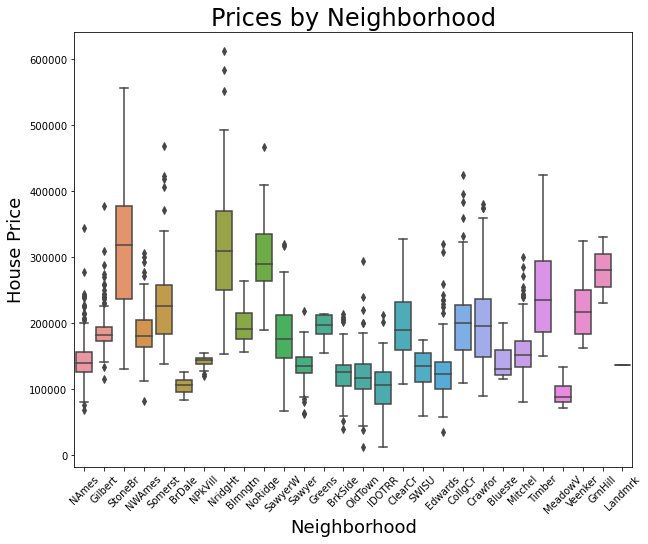

In [45]:
_, ax = plt.subplots(figsize=(10, 8))
sns.boxplot(x="Neighborhood", y="SalePrice", data=df, ax=ax)
ax.set_title("Prices by Neighborhood", fontsize=24)
ax.set_xlabel("Neighborhood", fontsize=18)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
ax.set_ylabel("House Price", fontsize=18);

# Neighborhood dictionary has the key of the Neighborhood code and the value of the address

In [46]:
Neighborhood_dict = {
    
   "Blmngtn" : "Bloomington Heights, Ames, Story County, Iowa, 50010, United States",
   "Blueste" : "Bluestem, Ames, Story County, Iowa, 50014, United States",
   "BrDale"  : "Briardale, Ames, Story County, Iowa, 50010, United States",
   "BrkSide" : "Brookside, Ames, Story County, Iowa, 50010, United States",
   "ClearCr" : "Clear Creek, Ames, Story County, Iowa, 50012, United States",
   "CollgCr" : "College Creek, Ames, Story County, Iowa, 50014, United States",
   "Crawfor" : "Crawford, Ames, Story County, Iowa, 50010, United States",
   "Edwards" : "Edwards, Ames, Story County, Iowa, 50014, United States",
   "Gilbert" : "Gilbert, Iowa, 50105, United States",
   "Greens"  : "Greens,  Iowa, United States",
   "GrnHill" : "Green hills dr, ames, story county, iowa, 50014, united states",
   "IDOTRR"  : "Iowa Department of Transportation , Iowa,  United States",
   "MeadowV" : "Meadow , Ames, Story County, Iowa, 50010, United States",
   "Mitchel" : "Mitchell, Ames, Story County, Iowa, 50010, United States",
   "NAmes"   : "North Ames, Ames, Story County, Iowa, 50014, United States",
   "NoRidge" : "Northridge, Ames, Story County, Iowa, 50014, United States",
   "NPkVill" : "North Park , Ames, Story County, Iowa, United States",
   "NridgHt" : "Northridge Heights, Ames, Story County, Iowa, United States",
   "NWAmes"  : "Northwest Ames, Ames, Story County, Iowa, 50010, United States",
   "OldTown" : "Old Town, Ames, Story County, Iowa, 50010, United States" ,
   "SWISU"   : "Iowa State University, Ames, Story County, Iowa, 50010, United States",
   "Sawyer"  : "Sawyer, Ames, Story County, Iowa, 50014, United States",
   "SawyerW" : "Sawyer, Ames, Story County, Iowa, 50014, United States",
   "Somerst" : "Somerset , Ames, Story County, Iowa, 50012, United States",
   "StoneBr" : "Stone , Ames, Story County, Iowa, 50010, United States",
   "Timber"  : "Timberland, Ames, Story County, Iowa, 50014, United States",
   "Veenker" : "Veenker, Ames, Story County, Iowa, 50012, United States",
   "Landmrk" : "Landmark, iowa, 50014, united states"

}

In [47]:
def GET_LAT_LONG(Address):
    
    geolocator = Nominatim(user_agent="user_agent")
    location = geolocator.geocode(Address)
    print(Address)
    return (location.latitude, location.longitude)

### Use the GET_LAT_LONG Function to fill up the ADDRESS_TO_LAT_LONG Dictionary 

In [48]:
ADDRESS_TO_LAT_LONG = {}
for Address in df["Neighborhood"].unique():
    ADDRESS_TO_LAT_LONG[Address] = GET_LAT_LONG(Neighborhood_dict[Address])

North Ames, Ames, Story County, Iowa, 50014, United States
Gilbert, Iowa, 50105, United States
Stone , Ames, Story County, Iowa, 50010, United States
Northwest Ames, Ames, Story County, Iowa, 50010, United States
Somerset , Ames, Story County, Iowa, 50012, United States
Briardale, Ames, Story County, Iowa, 50010, United States
North Park , Ames, Story County, Iowa, United States
Northridge Heights, Ames, Story County, Iowa, United States
Bloomington Heights, Ames, Story County, Iowa, 50010, United States
Northridge, Ames, Story County, Iowa, 50014, United States
Sawyer, Ames, Story County, Iowa, 50014, United States
Sawyer, Ames, Story County, Iowa, 50014, United States
Greens,  Iowa, United States
Brookside, Ames, Story County, Iowa, 50010, United States
Old Town, Ames, Story County, Iowa, 50010, United States
Iowa Department of Transportation , Iowa,  United States
Clear Creek, Ames, Story County, Iowa, 50012, United States
Iowa State University, Ames, Story County, Iowa, 50010, Unit

## Those are our Unique Values for The Latitude & Longitude

In [49]:
for key, value in ADDRESS_TO_LAT_LONG.items():
    print(f'{key: <10}{value}')

NAmes     (42.026716, -93.6556804)
Gilbert   (42.1069288, -93.6496628)
StoneBr   (42.0595161, -93.6330486)
NWAmes    (42.007919900000005, -93.61109774520256)
Somerst   (42.0495865, -93.645204)
BrDale    (42.052277000000004, -93.62837263648807)
NPkVill   (42.0497629, -93.62644813246666)
NridgHt   (42.0598105, -93.65479031446547)
Blmngtn   (42.0600876, -93.63919638156165)
NoRidge   (42.0485882, -93.6459435)
SawyerW   (42.0339239, -93.67664839687177)
Sawyer    (42.0339239, -93.67664839687177)
Greens    (41.58087075, -90.60208183962652)
BrkSide   (42.03050995, -93.63202367929867)
OldTown   (42.029516799999996, -93.61378147201995)
IDOTRR    (42.0207322, -93.62208142383324)
ClearCr   (42.0326417, -93.6532233)
SWISU     (42.00011725, -93.62089953415465)
Edwards   (42.01590145, -93.68558625319007)
CollgCr   (42.0184372, -93.6592179)
Crawfor   (42.0281126, -93.6071455)
Blueste   (42.0100464, -93.6447821)
Mitchel   (41.990584299999995, -93.6012579658094)
Timber    (41.999613, -93.649627)
MeadowV

## Merging The Latitude & Longitude into the dataframe

In [50]:
df = df.reindex(columns = df.columns.tolist() + ["Latitude" , "Longitude"])

In [51]:
LATITUDE_LIST = []
LONGITUDE_LIST = []

for i in range(len(df)):
    LATITUDE_LIST.append(ADDRESS_TO_LAT_LONG[df["Neighborhood"].iloc[i]][0])
    LONGITUDE_LIST.append(ADDRESS_TO_LAT_LONG[df["Neighborhood"].iloc[i]][1])

df["Latitude"] = LATITUDE_LIST
df["Longitude"] = LONGITUDE_LIST

In [52]:
fig = px.scatter_mapbox(df, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name="Neighborhood", 
                        zoom=8, 
                        height=700,
                        width=950)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [55]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
1st Flr SF,2632.0,6.070020,0.235378,5.168917,5.902876,6.063394,6.242133,6.796862
2nd Flr SF,2632.0,328.356003,416.206144,0.000000,0.000000,0.000000,689.000000,1862.000000
3Ssn Porch,2632.0,0.077888,2.551263,0.000000,0.000000,0.000000,0.000000,96.000000
Bedroom AbvGr,2632.0,2.843845,0.808267,0.000000,2.000000,3.000000,3.000000,6.000000
Bsmt Exposure,2632.0,1.604863,1.053321,0.000000,1.000000,1.000000,2.000000,4.000000
Bsmt Full Bath,2632.0,0.415653,0.515541,0.000000,0.000000,0.000000,1.000000,3.000000
Bsmt Half Bath,2632.0,0.060410,0.243029,0.000000,0.000000,0.000000,0.000000,2.000000
Bsmt Qual,2632.0,3.467705,0.903823,0.000000,3.000000,4.000000,4.000000,5.000000
Bsmt Unf SF,2632.0,563.466945,436.452646,0.000000,226.000000,470.500000,802.250000,2153.000000
BsmtFin SF 1,2632.0,432.230243,429.742740,0.000000,0.000000,370.500000,732.000000,2188.000000


In [56]:
bad_col = []
for i, x in enumerate(df.columns):
    if sorted(list(df[x].value_counts(normalize = True).values))[-1] >= 0.85 :
        bad_col.append(x)

In [57]:
print_column_list(bad_col)

3Ssn Porch       Three season porch area in square feet
Alley            Type of alley access to property
Bsmt Cond        Evaluates the general condition of the basement
Bsmt Half Bath   Basement half bathrooms
BsmtFin SF 2     Type 2 finished square feet
BsmtFin Type 2   Rating of basement finished area (if multiple types)
Central Air      Central air conditioning
Condition 1      Proximity to various conditions
Condition 2      Proximity to various conditions (if more than one is present)
Electrical       Electrical system
Enclosed Porch   Enclosed porch area in square feet
Exter Cond       Evaluates the present condition of the material on the exterior
Functional       Home functionality (Assume typical unless deductions are warranted)
Garage Cond      Garage condition
Garage Finish    Interior finish of the garage
Garage Qual      Garage quality
Heating          Type of heating
Kitchen AbvGr    Kitchens above grade
Land Contour     Flatness of the property
Land Slope       Slope o

In [58]:
remaining_columns = sorted(set(ALL_VARIABLES) - set(bad_col)) + TARGET_VARIABLES
df = df[remaining_columns]
update_column_descriptions(df.columns)

In [59]:
derived_variables = {
    "has 2nd Flr": "2nd Flr SF",
    "has Bsmt": "Total Bsmt SF",
    "has Fireplace": "Fireplaces",
    "has Garage": "Garage Area",
}

# Factorize numeric columns.
for factor_column, column in derived_variables.items():
    df[factor_column] = df[column].apply(lambda x: 1 if x > 0 else 0)
derived_variables = list(derived_variables.keys())

C:\Users\moham\AppData\Local\Temp\ipykernel_12048\2632773920.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\moham\AppData\Local\Temp\ipykernel_12048\2632773920.py:11: UserWarning:

FixedFormatter should only be used together with FixedLocator



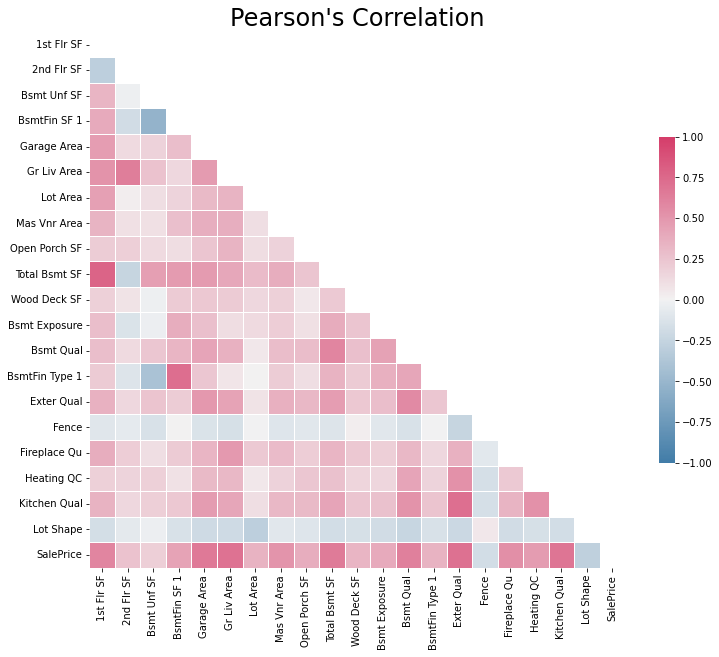

In [60]:
fig, ax = plt.subplots(figsize=(12, 12))
ax.set_title("Pearson's Correlation", fontsize=24)
# Blank out the upper triangular part of the matrix.
mask = np.zeros_like(df[CONTINUOUS_VARIABLES + ORDINAL_VARIABLES + TARGET_VARIABLES].corr(method="pearson"), dtype=bool)
mask[np.triu_indices_from(mask)] = True
# Use a diverging color map.
cmap = sns.diverging_palette(240, 0, as_cmap=True)
# Adjust the labels' font size.
labels = df[CONTINUOUS_VARIABLES + ORDINAL_VARIABLES + TARGET_VARIABLES].corr(method="pearson").columns
ax.set_xticklabels(labels, fontsize=10)
ax.set_yticklabels(labels, fontsize=10)
# Plot it.
sns.heatmap(
    df[CONTINUOUS_VARIABLES + ORDINAL_VARIABLES + TARGET_VARIABLES].corr(method="pearson"), vmin=-1, vmax=1, cmap=cmap, center=0, linewidths=.5,
    cbar_kws={"shrink": .5}, square=True, mask=mask, ax=ax
);

In [61]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
1st Flr SF,2632.0,6.070020,0.235378,5.168917,5.902876,6.063394,6.242133,6.796862
2nd Flr SF,2632.0,328.356003,416.206144,0.000000,0.000000,0.000000,689.000000,1862.000000
Bedroom AbvGr,2632.0,2.843845,0.808267,0.000000,2.000000,3.000000,3.000000,6.000000
Bsmt Exposure,2632.0,1.604863,1.053321,0.000000,1.000000,1.000000,2.000000,4.000000
Bsmt Full Bath,2632.0,0.415653,0.515541,0.000000,0.000000,0.000000,1.000000,3.000000
Bsmt Qual,2632.0,3.467705,0.903823,0.000000,3.000000,4.000000,4.000000,5.000000
Bsmt Unf SF,2632.0,563.466945,436.452646,0.000000,226.000000,470.500000,802.250000,2153.000000
BsmtFin SF 1,2632.0,432.230243,429.742740,0.000000,0.000000,370.500000,732.000000,2188.000000
BsmtFin Type 1,2632.0,3.549392,2.132229,0.000000,1.000000,4.000000,6.000000,6.000000
Exter Qual,2632.0,3.386398,0.566395,2.000000,3.000000,3.000000,4.000000,5.000000


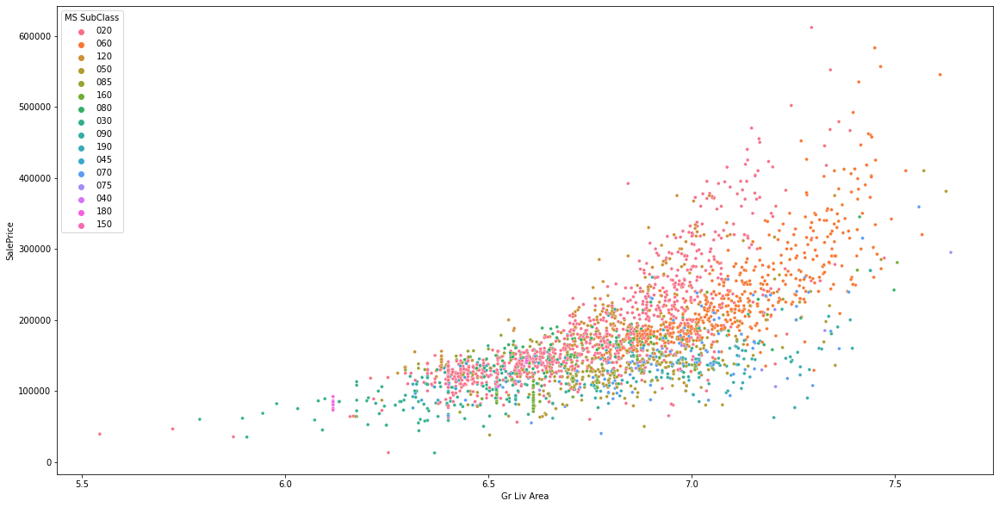

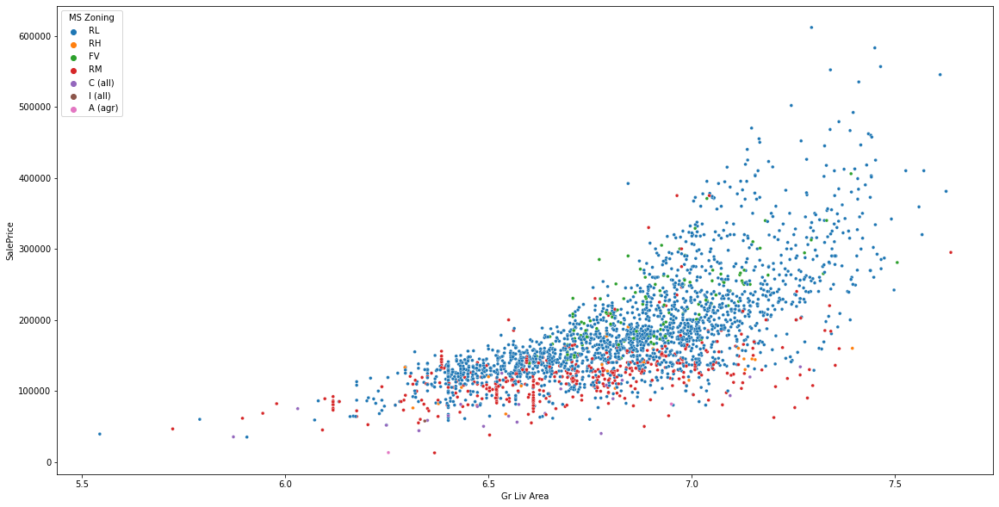

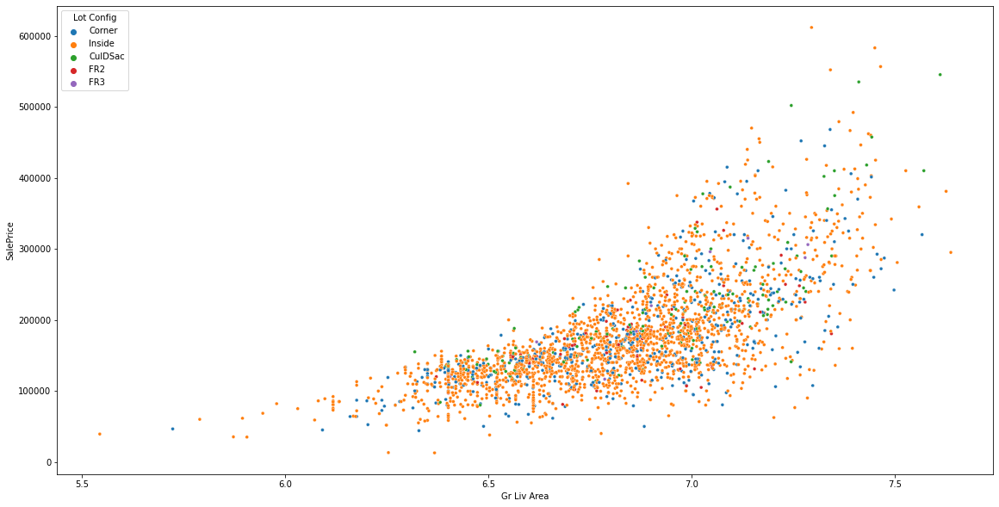

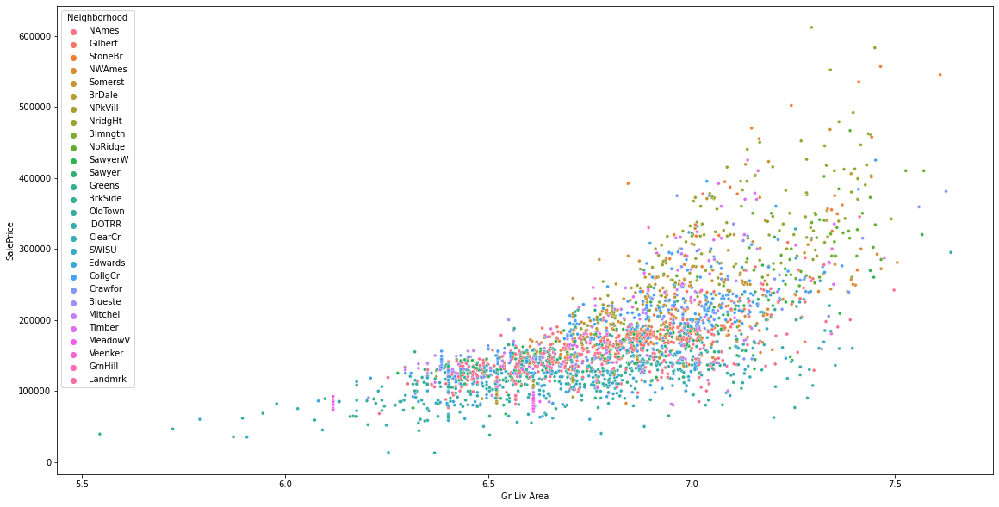

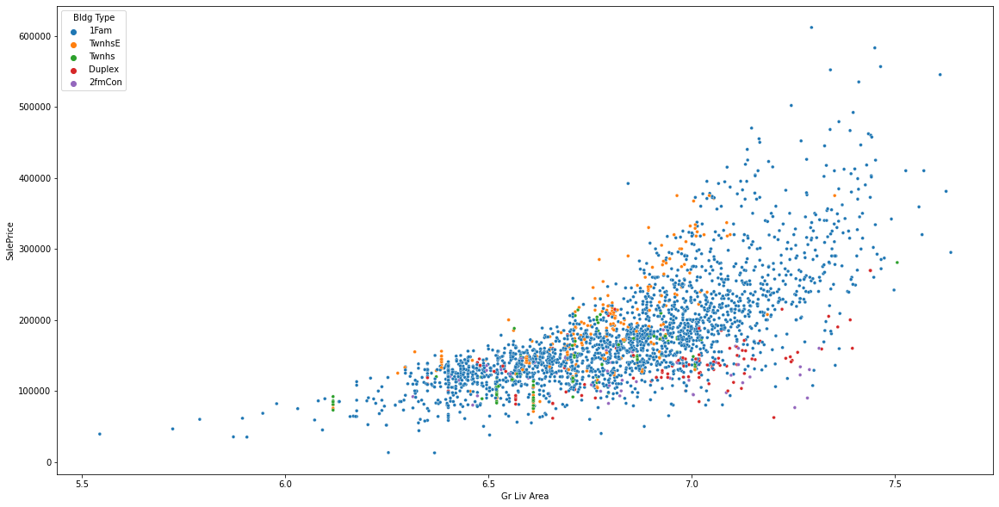

...

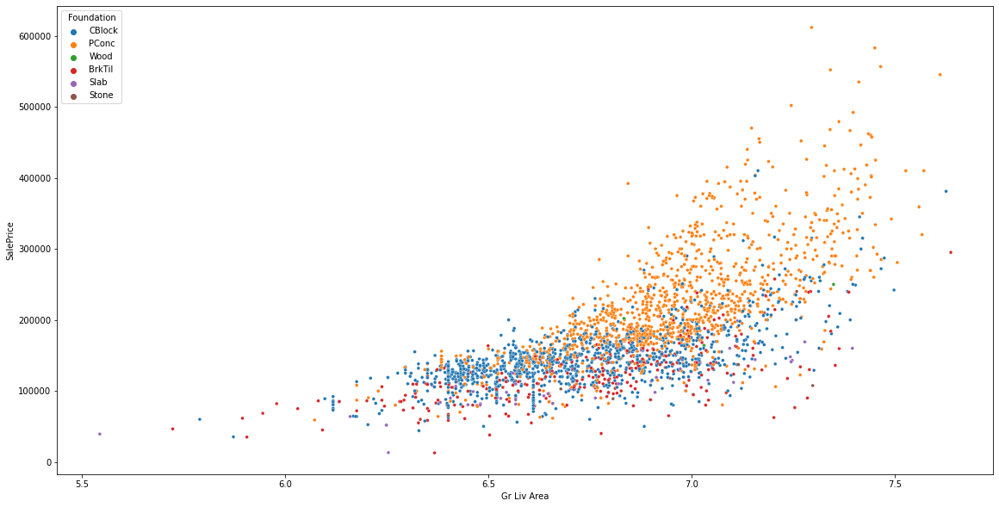

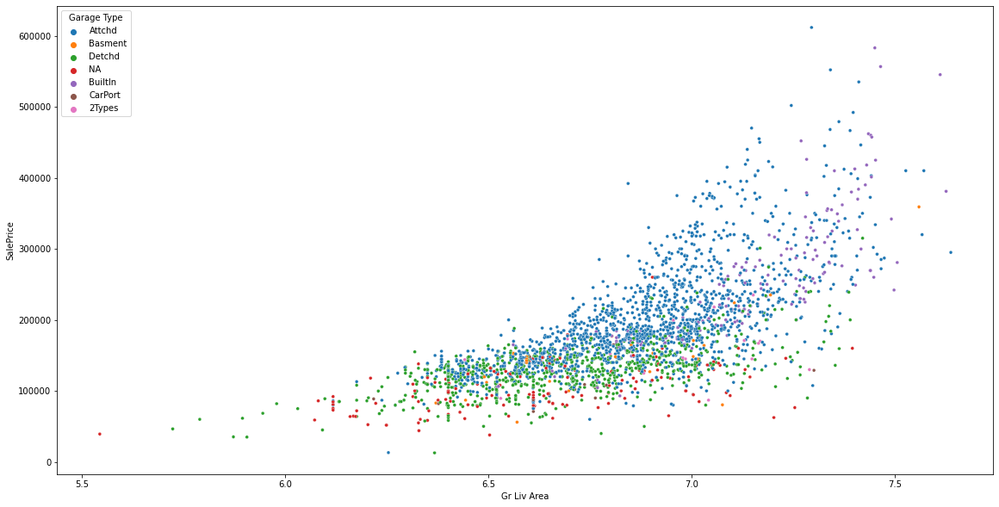

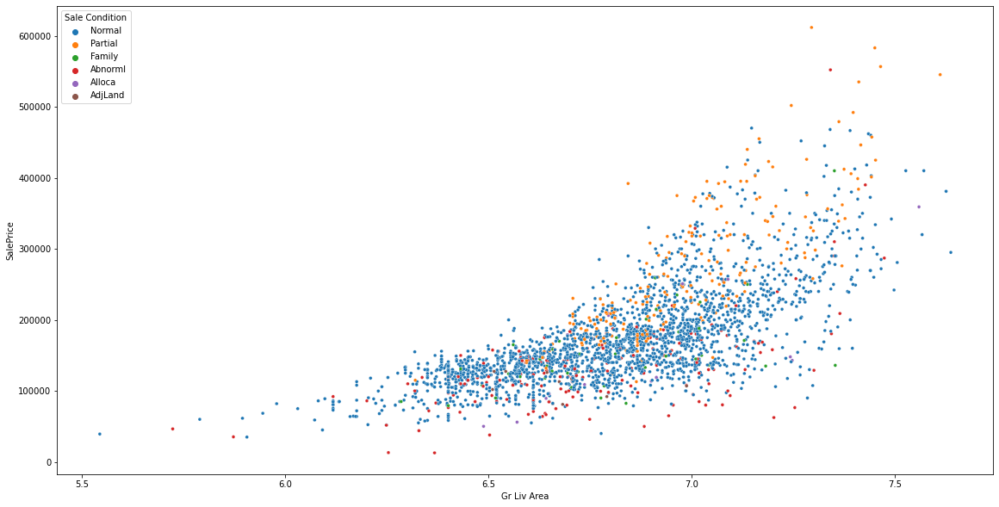

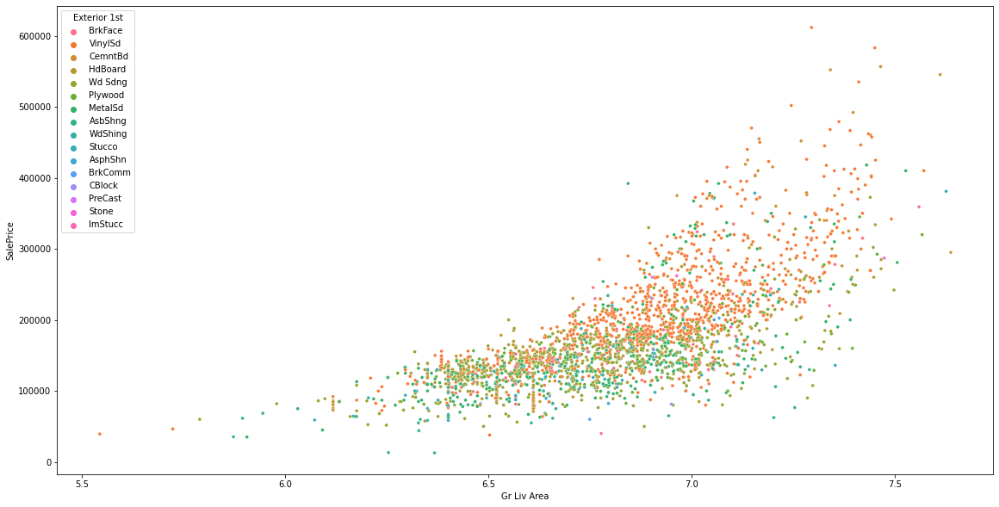

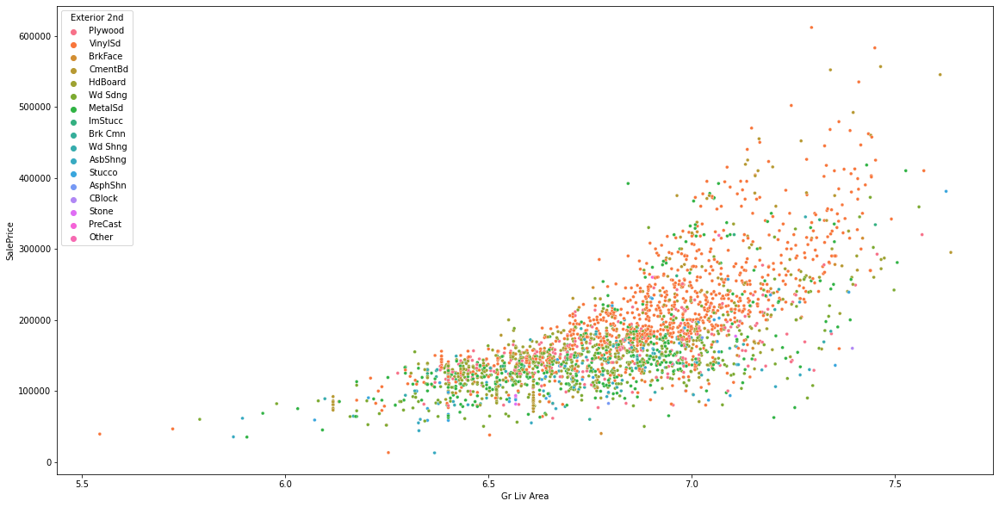

In [62]:
for i, x in enumerate(df[NOMINAL_COLUMNS]):
    plt.figure(figsize = (300,10))
    plt.subplot (1,df[NOMINAL_COLUMNS].shape[1],i+1)
    sns.scatterplot(x="Gr Liv Area", y="SalePrice", hue=x, s=15, data=df);

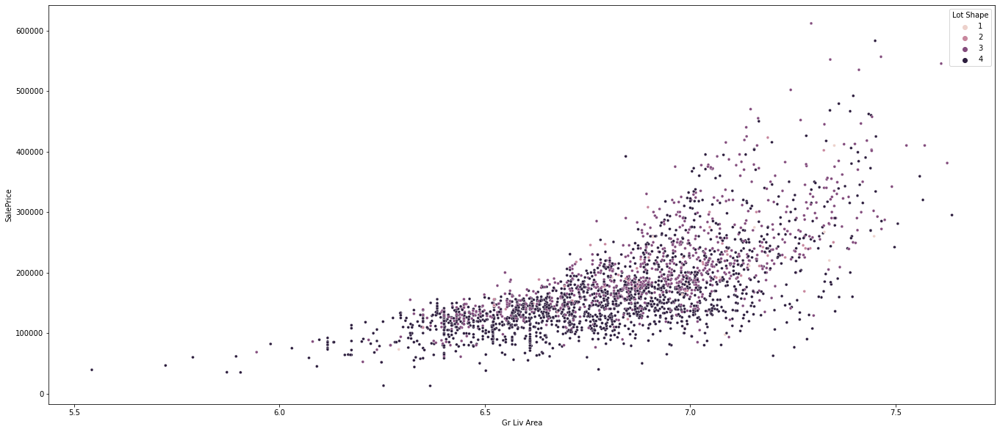

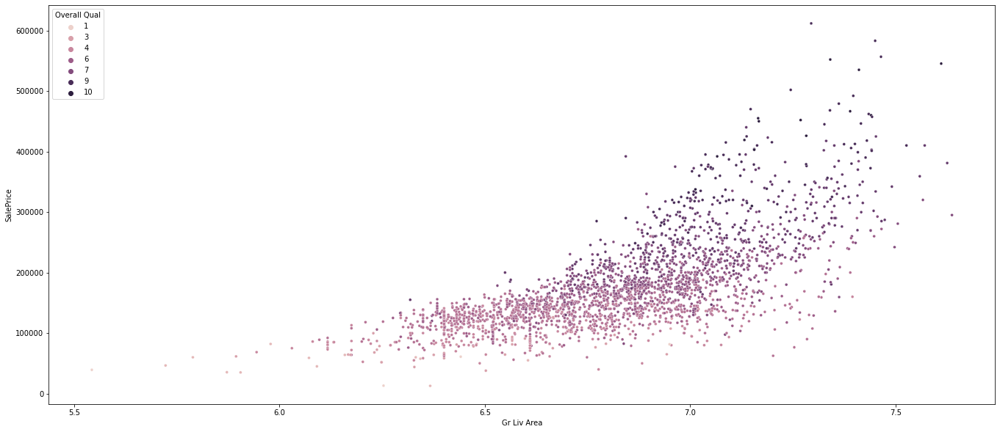

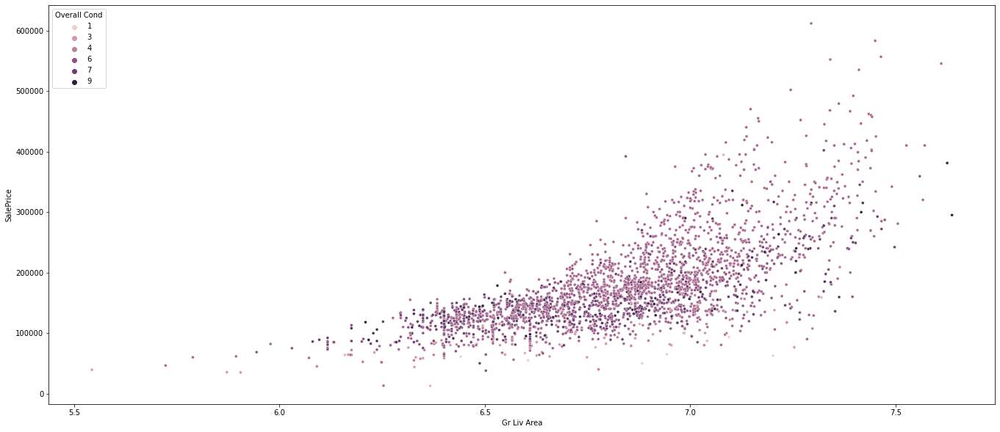

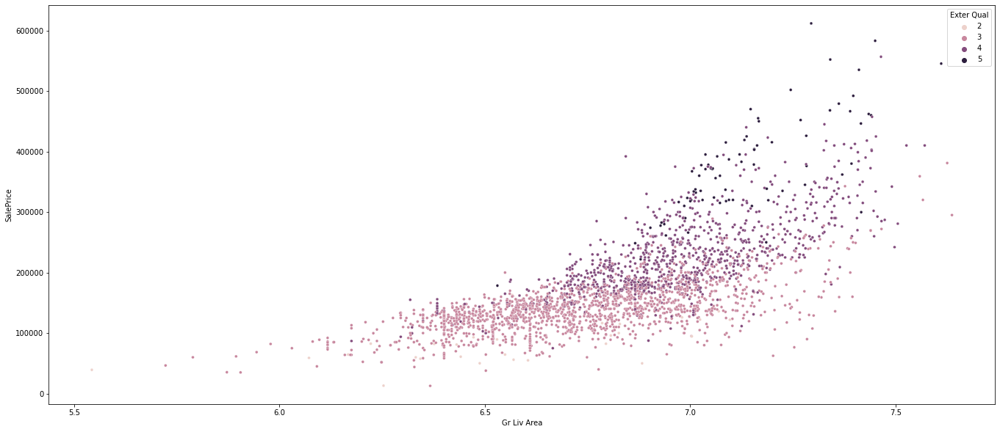

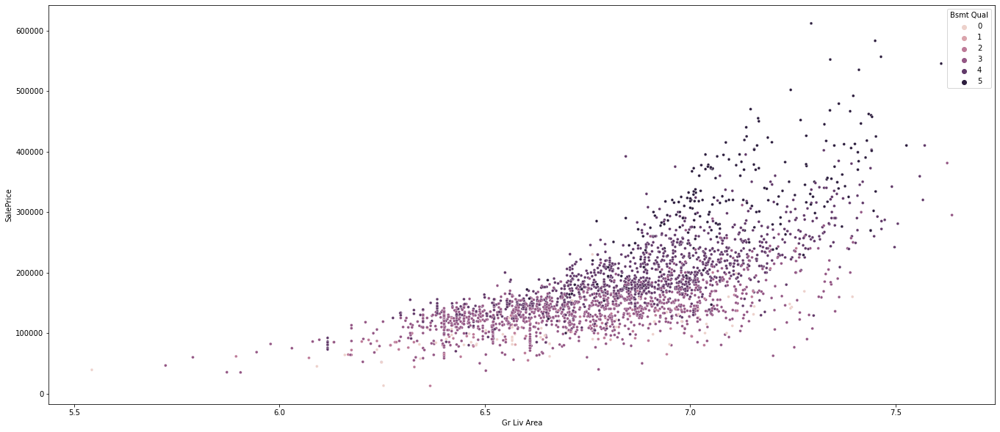

...

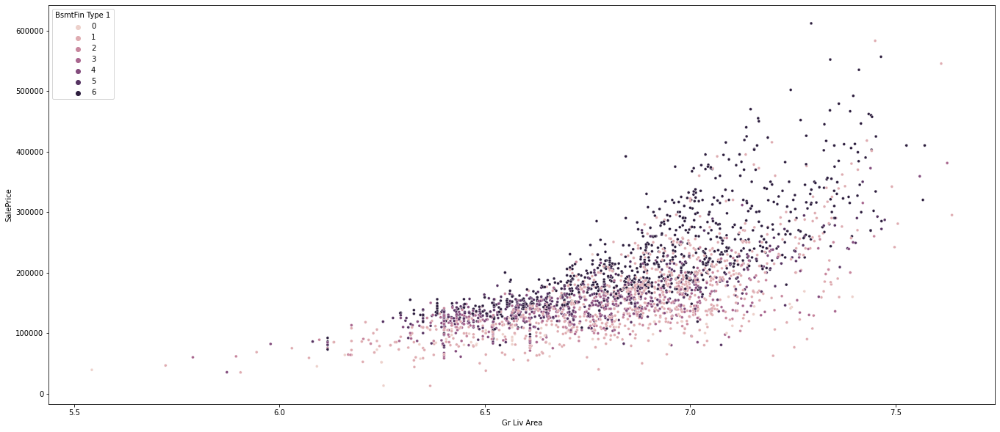

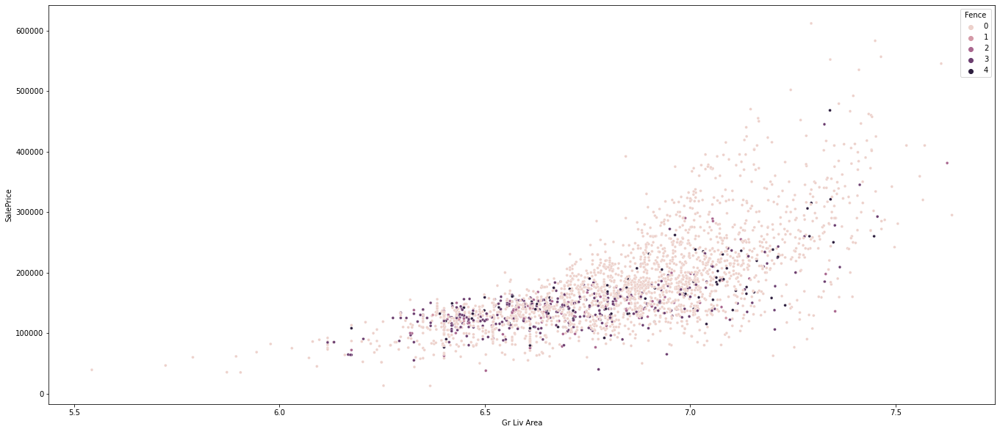

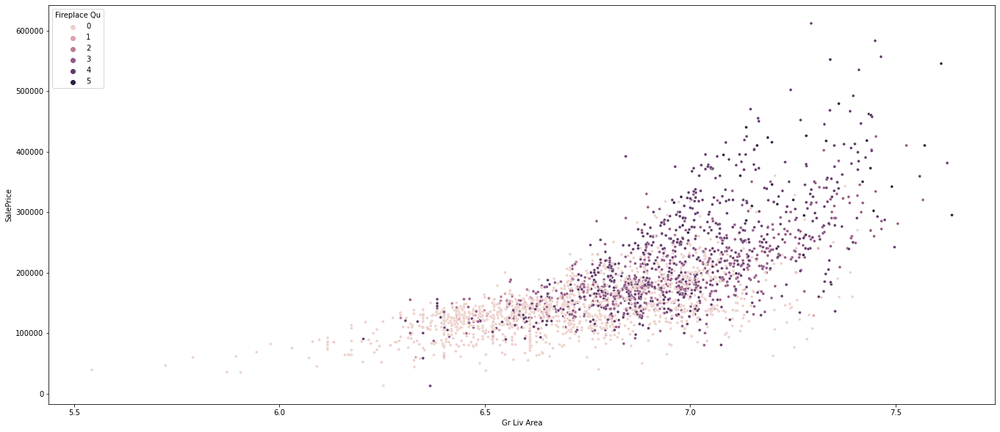

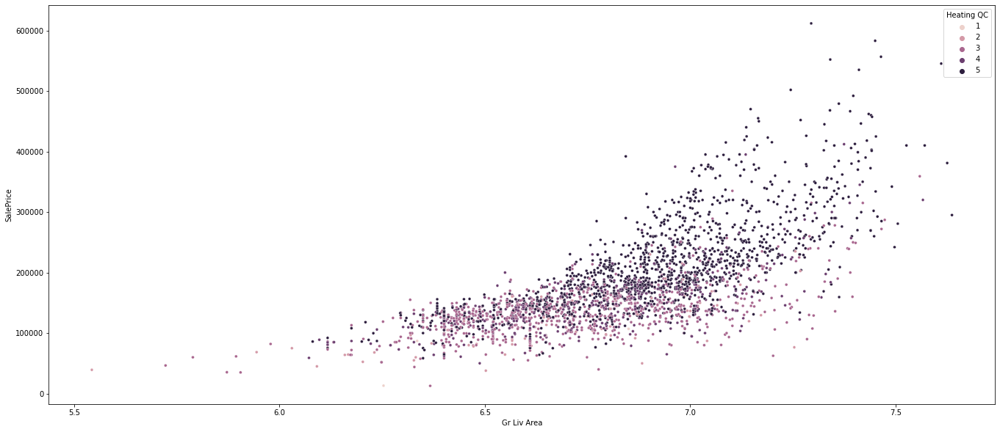

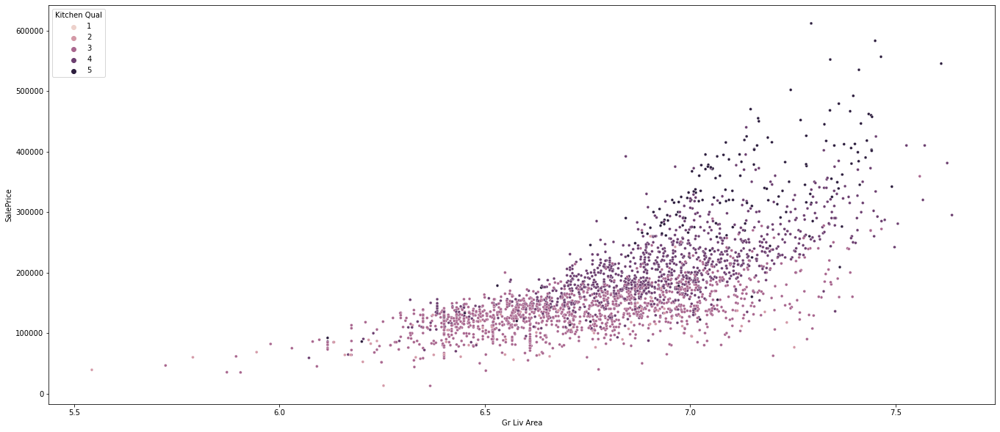

In [63]:
for i, x in enumerate(df[ORDINAL_COLUMNS]):
    plt.figure(figsize = (300,10))
    plt.subplot (1,df[ORDINAL_COLUMNS].shape[1],i+1)
    sns.scatterplot(x="Gr Liv Area", y="SalePrice", hue=x, s=15, data=df);

In [64]:
for i in list(df[NOMINAL_COLUMNS].columns):
    dummies = pd.get_dummies(df[i])
    df = pd.concat([df, dummies], axis=1)
    
df.drop(list(df[NOMINAL_COLUMNS].columns), axis = 1, inplace = True) 


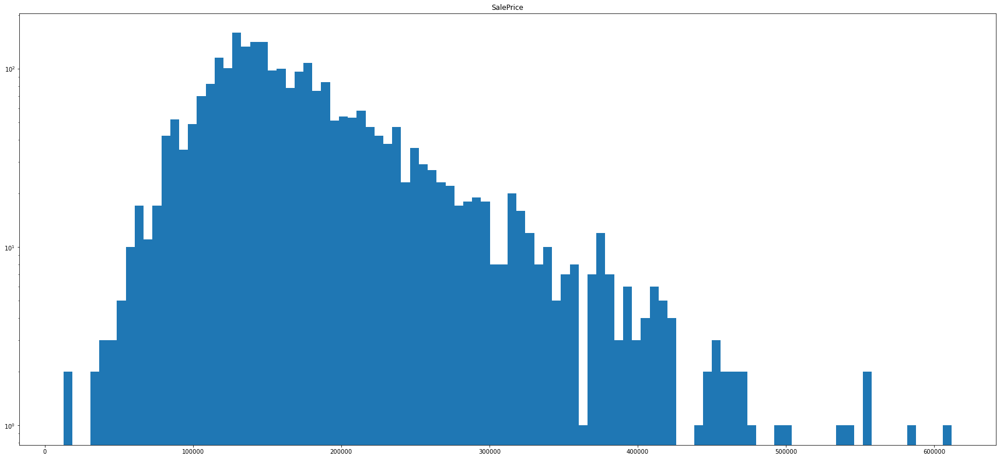

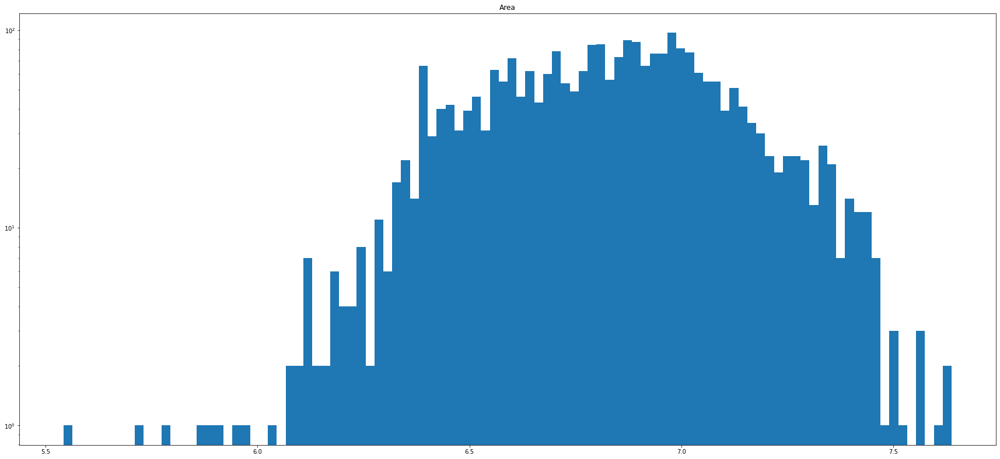

In [65]:
plt.figure(figsize = (30,30))
plt.subplot (2,1,1)
plt.hist(df['SalePrice'],bins = 100, log = True);
plt.title("SalePrice")

plt.figure(figsize = (30,30))
plt.subplot (2,1,2)
plt.hist(df['Gr Liv Area'],bins = 100, log = True);
plt.title("Area")

plt.show()

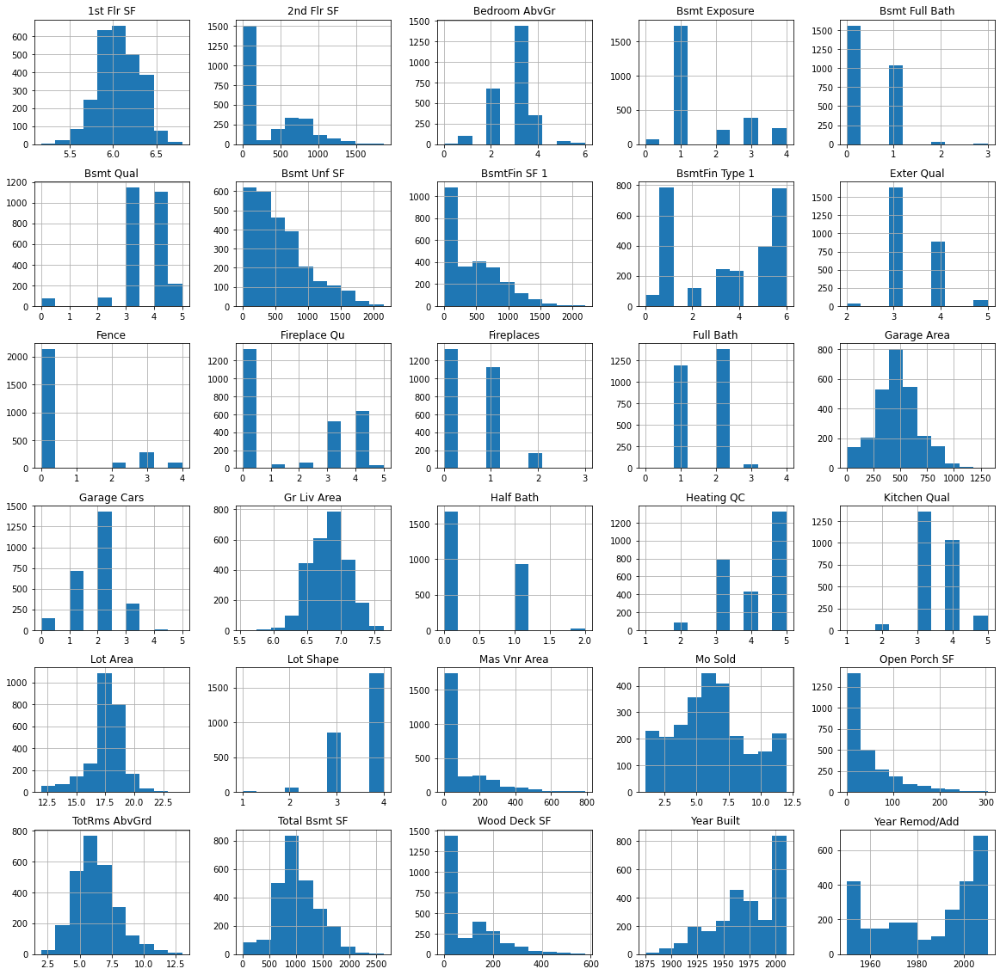

In [66]:
df.iloc[: , :32].hist(figsize=(20,20))
plt.show()

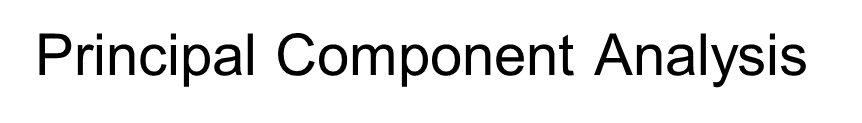

In [67]:
#importing PCA from SkLearn library
from sklearn.decomposition import PCA
#Initiating PCA to reduce dimentions aka features to 3
pca = PCA(n_components=3)
#fit the model and apply the dimensionality reduction on dataset
pca.fit(df.values)
x_pca = pd.DataFrame(pca.transform(df.values), columns=(["x1","x2","x3"]))
x_pca.describe()

,x1,x2,x3
count,2.632000e+03,2.632000e+03,2.632000e+03
mean,7.731396e-12,5.112020e-14,1.185678e-13
std,7.408525e+04,5.369684e+02,4.867941e+02
min,-1.635412e+05,-1.285347e+03,-1.310249e+03
25%,-4.833016e+04,-4.174092e+02,-3.889863e+02
50%,-1.832941e+04,-9.936107e+01,-1.113970e+02
75%,3.294676e+04,4.219138e+02,4.508162e+02
max,4.353303e+05,1.604199e+03,1.900255e+03


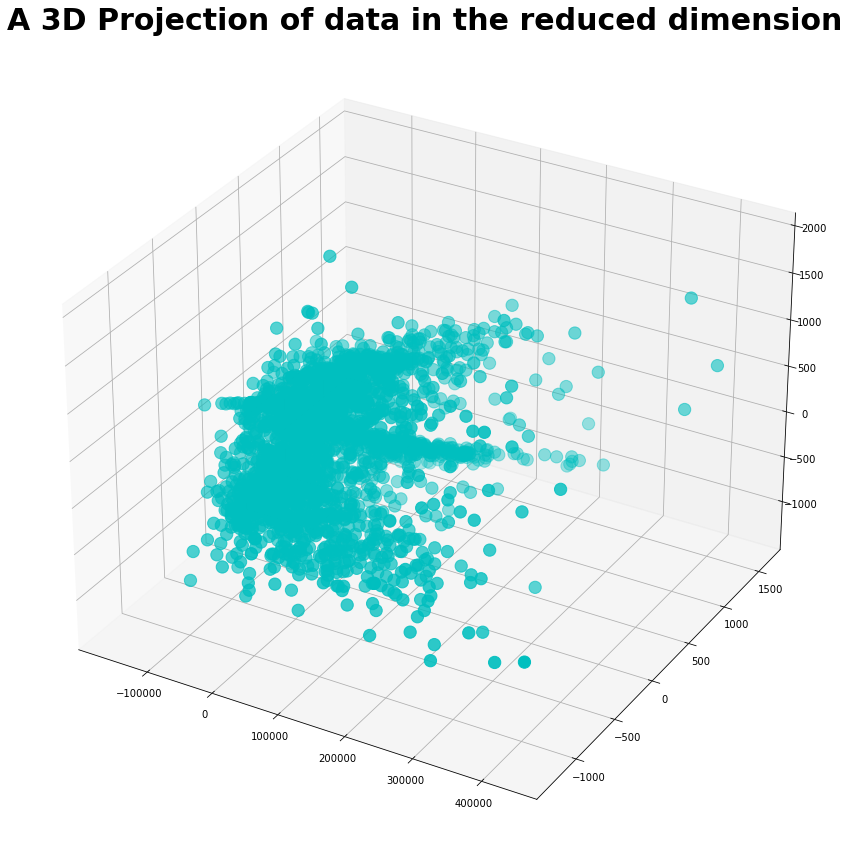

In [68]:
#A 3D Projection Of Data In The Reduced Dimension
x=x_pca['x1']
y=x_pca['x2']
z=x_pca['x3']

# Scatter Plotting PCA
fig=plt.figure(figsize=(15,15))
xyz=fig.add_subplot(111,projection="3d")
xyz.scatter(x,y,z,s=150, c="c" , marker="o")
xyz.set_title("A 3D Projection of data in the reduced dimension",fontsize=30,weight='bold')
plt.show()

# CLUSTERING:


# elbow method for k means

Equation of within-cluster sum of squares (wcss)
$$
wcss = \displaystyle\sum\limits_{i \in n}(X_{i} - Y_{i})^{2}
$$

In [69]:
# Within-Cluster-Sum-of-Squares
k_means_wcss = []
for i in range(2,11):
    k_means = KMeans(n_clusters=i)
    k_means.fit(x_pca.to_numpy())
    k_means_wcss.append(k_means.inertia_)

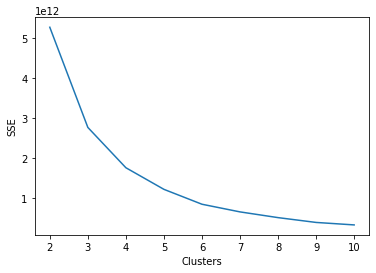

In [70]:
#plot elbow curve
plt.plot(np.arange(2,11),k_means_wcss)
plt.xlabel('Clusters')
plt.ylabel('SSE')
plt.show()

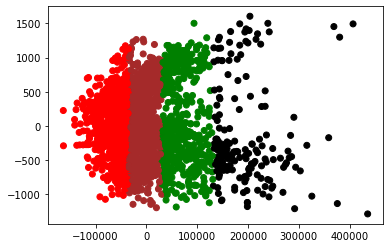

In [71]:
# 1. define k
k = 4

# 2. randomly place k centroids
centroids = x_pca.sample(k).values

for i in range(50):
    
    # 3. assign each point to a cluster( the cluster of the closest centroid)
    for i in range(k):

        x_pca[i] = np.sqrt(
            (x_pca['x1'] - centroids[i][0]) ** 2 +
            (x_pca['x2'] - centroids[i][1]) ** 2 +
            (x_pca['x3'] - centroids[i][2]) ** 2
        )

    colors = {0: 'red', 1:'green', 2: 'black', 3:'brown' }
    x_pca['closest'] = x_pca.loc[:, [0,1,2,3]].idxmin(axis=1)
    x_pca['color'] = x_pca['closest'].map(lambda x: colors[x])
    old  = centroids.copy
    # 4. update the centroids(the new centroid is the mean of the cluster)
    for i in range(len(centroids)):
        centroids[i][0] = np.mean(x_pca[x_pca['closest'] == i]['x1'])
        centroids[i][1] = np.mean(x_pca[x_pca['closest'] == i]['x2'])
        centroids[i][2] = np.mean(x_pca[x_pca['closest'] == i]['x3'])


    if np.all(old == centroids):
        break
    # 5. repeat from step 3

plt.scatter(x_pca['x1'], x_pca['x2'], c = x_pca['color']);

# elbow method for Agglomerative

linkage{‘ward’, ‘complete’, ‘average’, ‘single’}, default=’ward’


‘ward’ minimizes the variance of the clusters being merged.

‘average’ uses the average of the distances of each observation of the two sets.

‘complete’ or ‘maximum’ linkage uses the maximum distances between all observations of the two sets.

‘single’ uses the minimum of the distances between all observations of the two sets.

In [72]:
from sklearn.cluster import AgglomerativeClustering

def wss_calculation(K, data):
    WSS = []
    for i in range(K):
        cluster = AgglomerativeClustering(n_clusters= i+1, affinity='euclidean', linkage='average')  
        cluster.fit_predict(data)
        # cluster index
        label = cluster.labels_
        wss = []
        for j in range(i+1):
            # extract each cluster according to its index
            idx = [t for t, e in enumerate(label) if e == j]
            cluster = data[idx,]
            # calculate the WSS:
            cluster_mean = cluster.mean(axis=0)
            distance = np.sum(np.abs(cluster - cluster_mean)**2,axis=-1)
            wss.append(sum(distance))
        WSS.append(sum(wss))
    return WSS

In [73]:
WSS=wss_calculation(10, df.to_numpy())

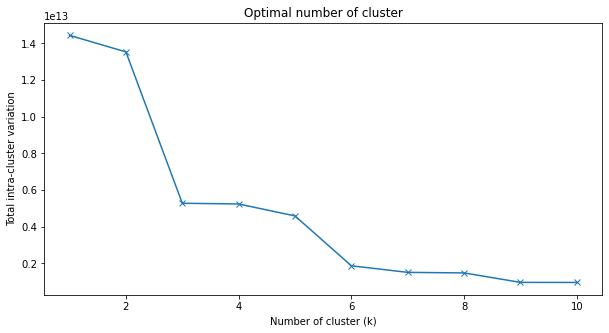

In [74]:
cluster_range = range(1, 11)

plt.figure(figsize=(10,5))
plt.title('Optimal number of cluster')
plt.xlabel('Number of cluster (k)')
plt.ylabel('Total intra-cluster variation')
plt.plot(cluster_range, WSS, marker = "x");

## focus on finding where the acceleration of distance growth is the biggest:

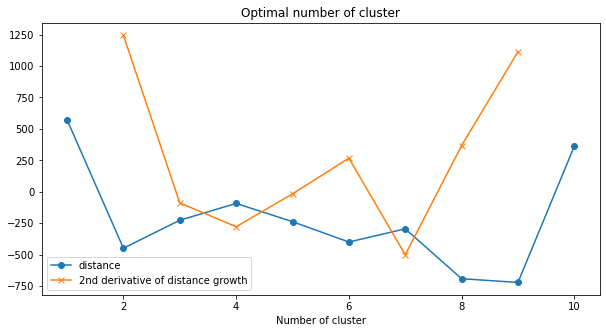

clusters: 2


In [75]:
last = x_pca.to_numpy()[-10:, 2]
last_rev = last[::-1]
idxs = np.arange(1, len(last) + 1)

plt.figure(figsize=(10,5))
plt.title('Optimal number of cluster')
plt.xlabel('Number of cluster')

plt.plot(idxs, last_rev, marker = "o", label="distance")

accele = np.diff(last, 2)  # 2nd derivative of the distances
accele_rev = accele[::-1]
plt.plot(idxs[:-2] + 1, accele_rev, marker = "x", label = "2nd derivative of distance growth")

plt.legend()
plt.show()
k = accele_rev.argmax() + 2  # if idx 0 is the max of this we want 2 clusters
print ("clusters:", k)

# Dendrogram plot

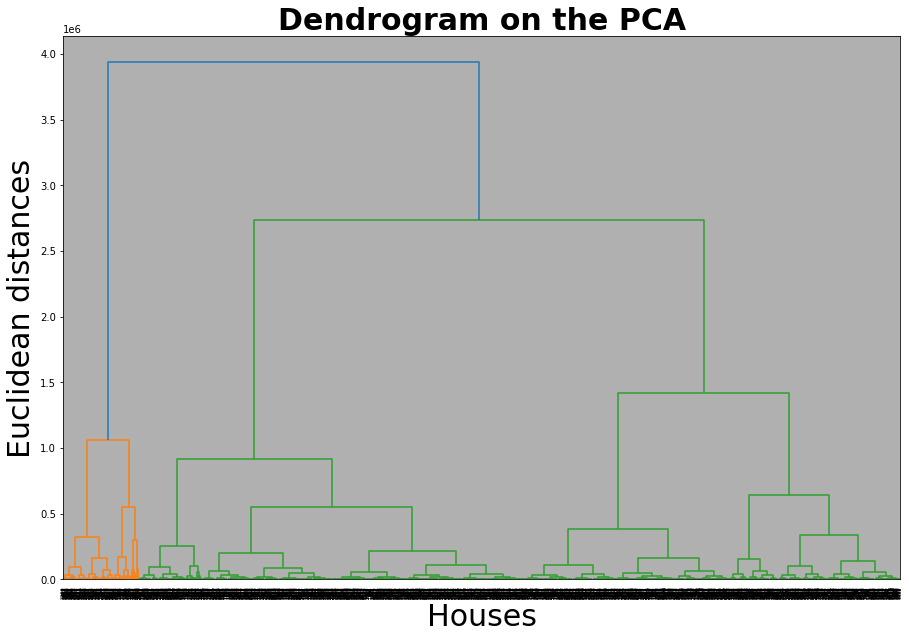

In [76]:
import scipy.cluster.hierarchy as sch
#Dendrogram plot
plt.figure(figsize=(15,10))
plt.title('Dendrogram on the PCA',fontsize=30,weight='bold')
plt.xlabel('Houses',fontsize=30)
plt.ylabel('Euclidean distances',fontsize=30)
plt.hlines(y=0.5,xmin=0,xmax=2000,lw=3,linestyles='--')
plt.grid(True)
dendrogram = sch.dendrogram(sch.linkage(x_pca.iloc[:,0:3], method = 'ward',metric='euclidean'))
plt.show()

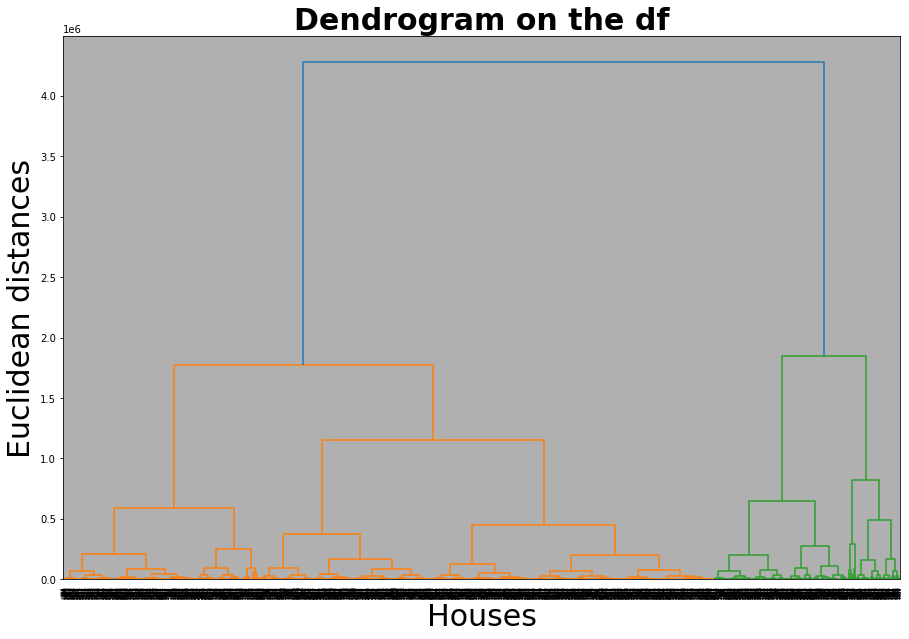

In [77]:
#Dendrogram plot
plt.figure(figsize=(15,10))
plt.title('Dendrogram on the df',fontsize=30,weight='bold')
plt.xlabel('Houses',fontsize=30)
plt.ylabel('Euclidean distances',fontsize=30)
plt.hlines(y=0.5,xmin=0,xmax=2000,lw=3,linestyles='--')
plt.grid(True)
dendrogram = sch.dendrogram(sch.linkage(df, method = 'ward',metric='euclidean'))
plt.show()


In [78]:
from sklearn.cluster import AgglomerativeClustering

#building Agglomerative Clustering modelg 
ac=AgglomerativeClustering(n_clusters=7,affinity='euclidean',linkage='ward')
# fit model and creating the prediction of the dataset
pre_ac=ac.fit_predict(x_pca.iloc[:,0:3])
# Assigning the Clusters feature to the Data In The Reduced Dimension
x_pca["Clusters"]=pre_ac
#Assigning the Clusters feature to the orignal dataframe.
df["Clusters"]= pre_ac


In [79]:
df["Clusters"].value_counts(normalize=True).mul(100)

1    38.563830
3    24.658055
2    14.551672
5     7.560790
4     6.003040
6     5.699088
0     2.963526
Name: Clusters, dtype: float64

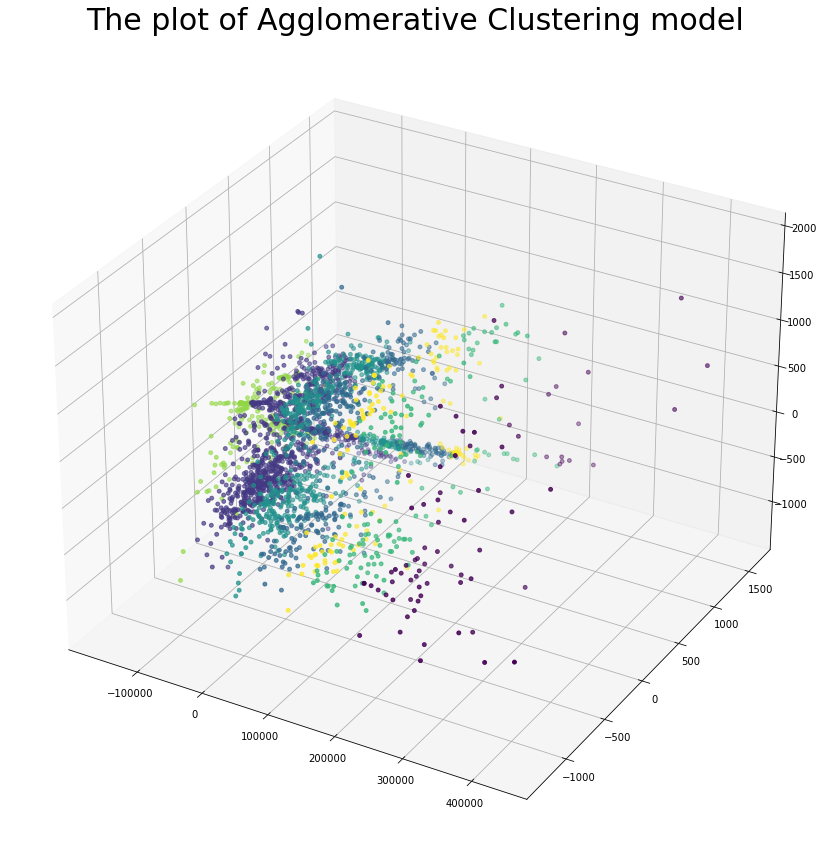

In [80]:
# plotting the clusters in Dataset
#3D projection 
fig = plt.figure(figsize=(20,15))
plot = plt.subplot(111, projection='3d', label="bla")
plot.set_title("The plot of Agglomerative Clustering model",fontsize=30)

plot.scatter(x,y,z ,s=15 ,c=pre_ac , marker='o',cmap='viridis')


plt.show()

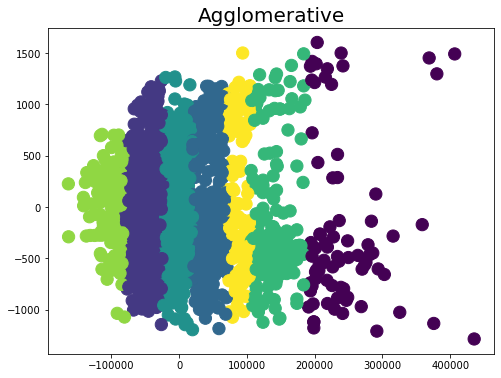

In [81]:
# 2D projection plotting
fig =plt.figure(figsize=(8,6))
plt.title("Agglomerative",fontsize=20)
plt.scatter(x,y, c=pre_ac, s=150, cmap='viridis');

In [82]:
score = silhouette_score(x_pca.iloc[:,0:3],ac.labels_, metric='euclidean')
print('Silhouetter Score for Agglomerative Clustering model: %.3f' % score)

Silhouetter Score for Agglomerative Clustering model: 0.511


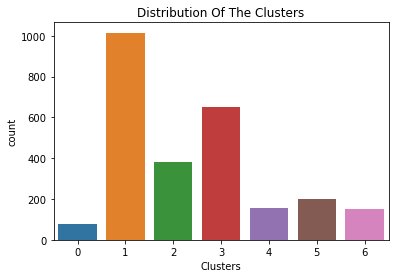

In [83]:
#Plotting countplot of clusters
pl = sns.countplot(x=df["Clusters"])
pl.set_title("Distribution Of The Clusters")
plt.show()

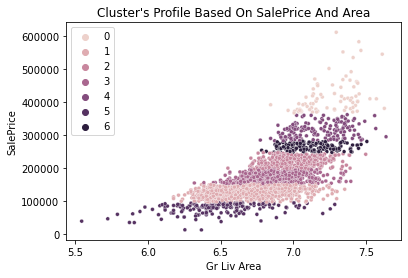

In [84]:
pl = sns.scatterplot(x="Gr Liv Area", y="SalePrice", hue=df["Clusters"], s=15, data=df);
pl.set_title("Cluster's Profile Based On SalePrice And Area")
plt.legend()
plt.show()

In [85]:
x = df.drop(['SalePrice'], axis = 1)
y = df['SalePrice']

In [86]:
_70 = int(len(df) * .7)

x_train, y_train = x[:_70], y[:_70]

#=============================================================

x_test, y_test = x[_70:], y[_70:]

In [87]:

RandomForestModel = RandomForestRegressor()
RandomForestModel.fit(x_train, y_train)
y_pred_RandomForestModel = RandomForestModel.predict(x_test)

print(f"R2 returned from RandomForestModel Model {r2_score(y_test, y_pred_RandomForestModel)*100}")

R2 returned from RandomForestModel Model 94.86219507163955


In [88]:
from pprint import pprint
print('Parameters currently in use:')
pprint(RandomForestModel.get_params())

Parameters currently in use:
{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


In [89]:
linear_model = linear_model.LinearRegression()
linear_model.fit(x_train, y_train)
y_pred_linear_model = linear_model.predict(x_test)

In [91]:
print(f"R2 returned from SKlearn Model {r2_score(y_test, y_pred_linear_model)*100}")

R2 returned from SKlearn Model 90.66990486852042
